Topics:

INTRO TO ML & ITS ROLE IN DATA ANALYSIS
TYPES OF MACHINE LEARNING - SUPERVISED, UNSUPERVISED & REINFORCEMENT 
DATA PREPROCCESING - HANDLING THE MISSING VALUES, OUTLIER & METHODS TO HANDLE OUTLIERS - IQR METHOD & Z METHOD
FEATURE SCALING
LINEAR REGRESSION AS REGRESSION TECHNIQUE
SIMPLE LINEAR REGRESSION
MODEL EVALUATION METRICS FOR REGRESSION
MEAN ABSOLUTE ERROR (MAE)
MEAN SQUARED ERROR (MSE)
ROOT MEAN SQUARED ERROR (RMSE)
R-SQUARED (COEFFICIENT OF DETERMINATION)
MULTIPLE LINEAR REGRESSION
INBUILT DATASET
CAIFORNIA HOUSING DATASET - MODEL EAVLAUTION

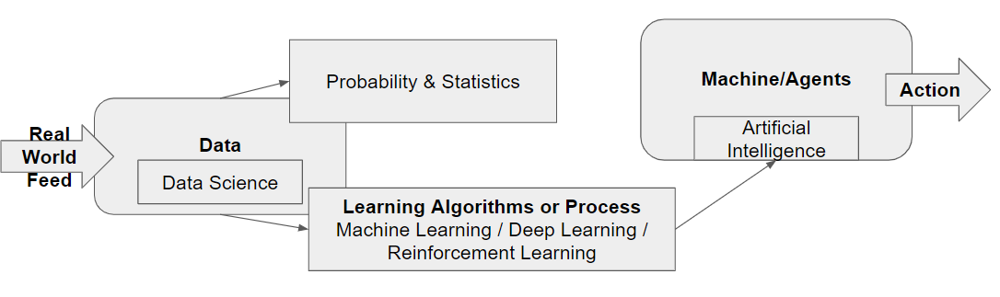

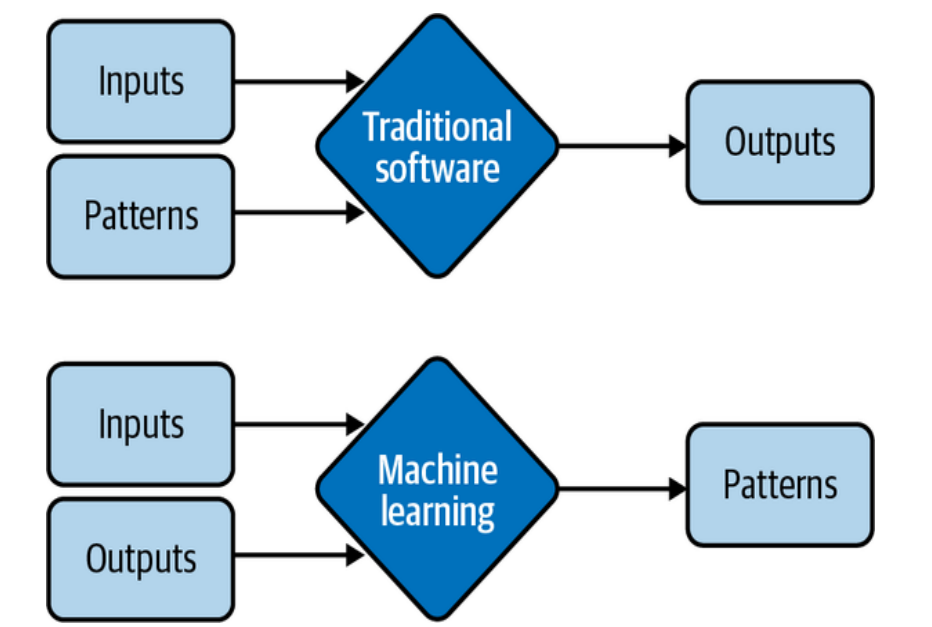

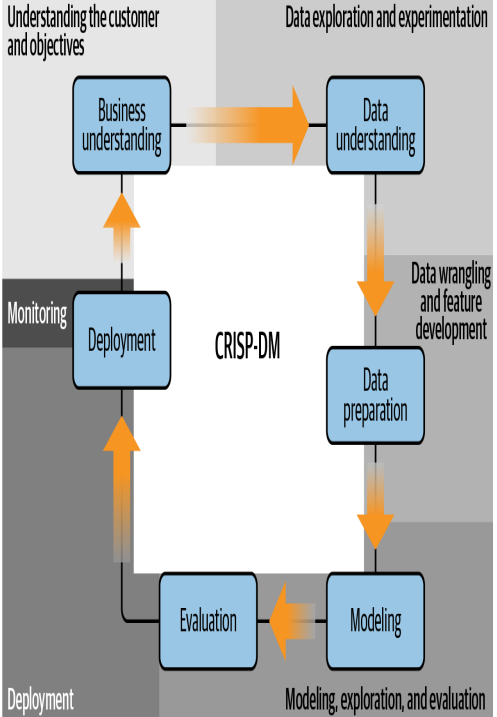

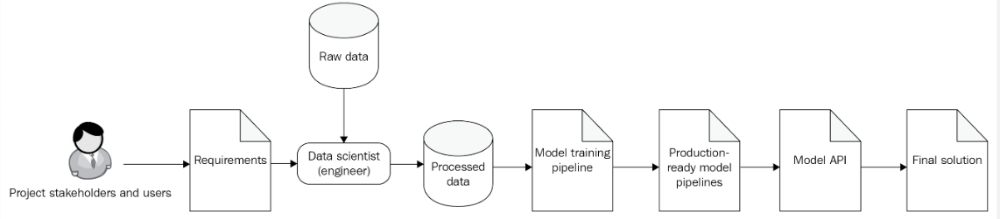

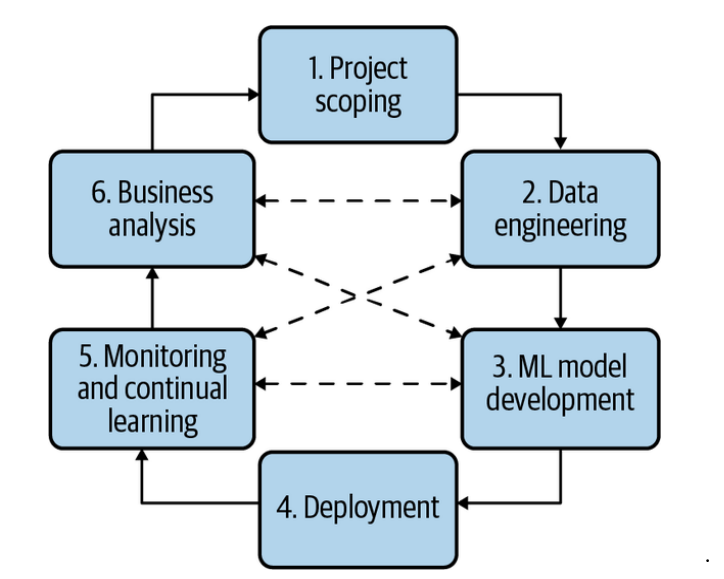

...

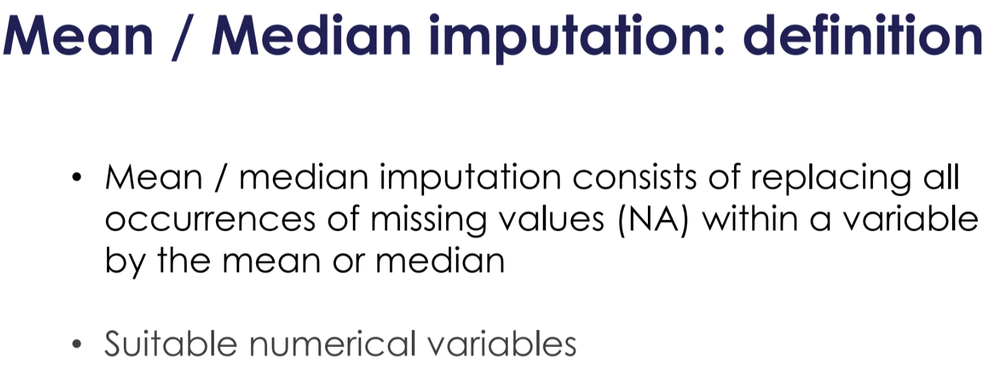

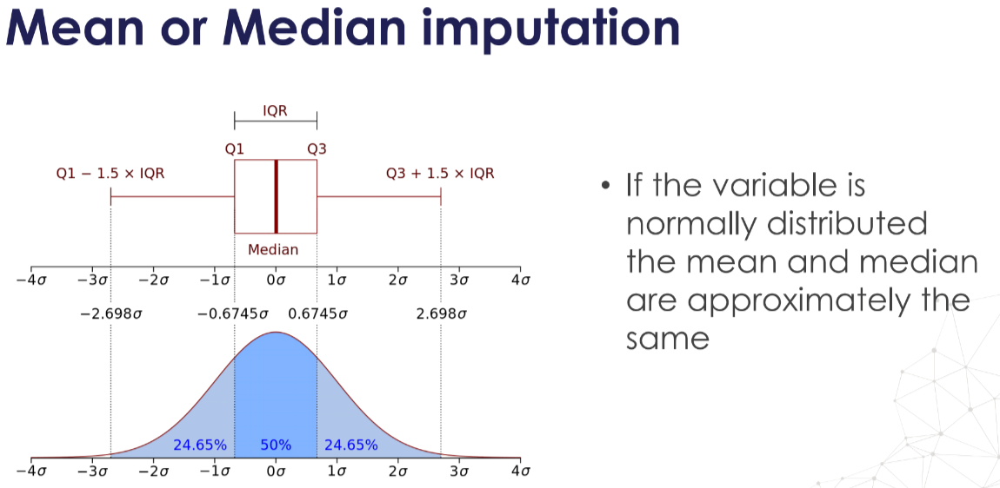

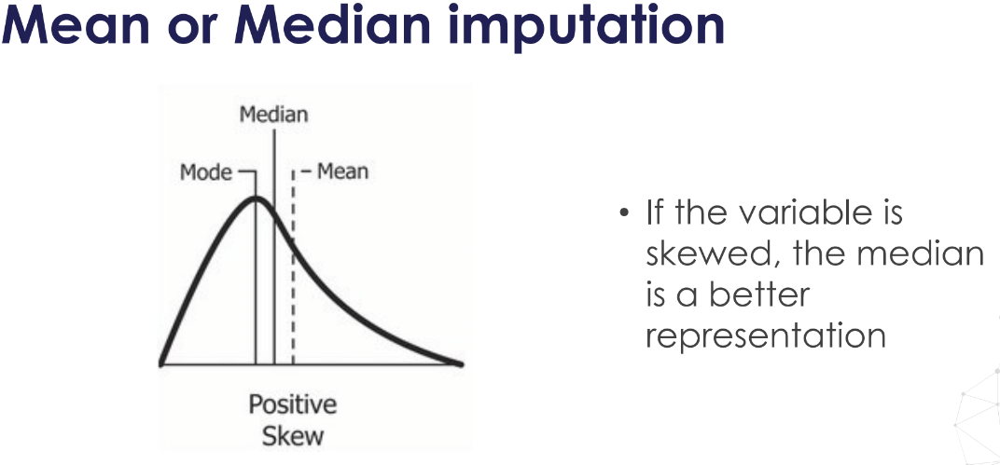

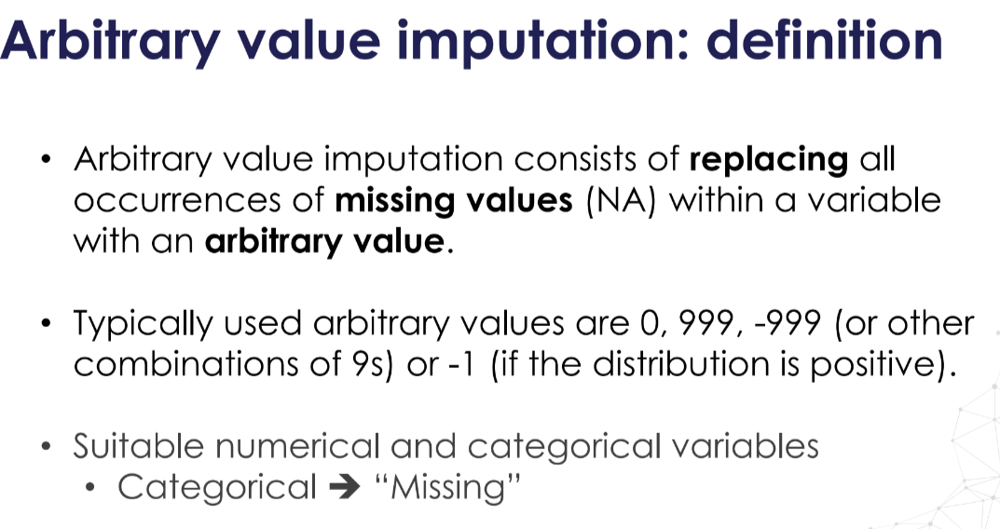

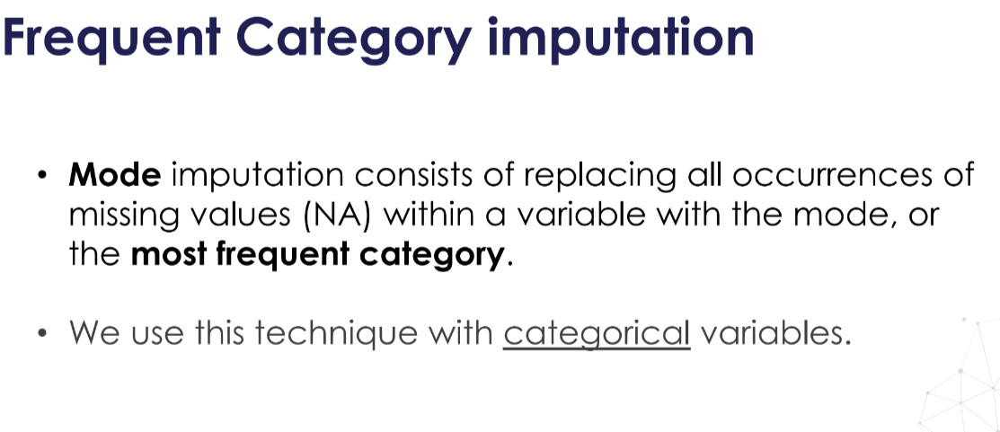

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

# transformers to impute missing data with sklearn:

from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer

# to split the datasets
from sklearn.model_selection import train_test_split

In [10]:
# We use only the following variables for the demo

cols_to_use = [
    "OverallQual",
    "TotalBsmtSF",
    "1stFlrSF",
    "GrLivArea",
    "WoodDeckSF",
    "BsmtUnfSF",
    "LotFrontage",
    "MasVnrArea",
    "GarageYrBlt",
    "SalePrice",
]

In [11]:
# let's load the House Prices dataset
import pandas as pd

data = pd.read_csv(".\Datasets\houseprice.csv", usecols=cols_to_use)

# Get rows where any cell has a null value
null_data = data[data.isnull().any(axis=1)]

# Get a sample of 5 rows with null values
sample_null_data = null_data.sample(5)
sample_null_data

,LotFrontage,OverallQual,MasVnrArea,BsmtUnfSF,TotalBsmtSF,1stFlrSF,GrLivArea,GarageYrBlt,WoodDeckSF,SalePrice
1097,NaN,8,0.0,1074,1074,1088,1088,1987.0,0,170000
319,NaN,7,225.0,336,1372,1472,1472,1980.0,233,187500
1143,NaN,5,0.0,718,1006,1006,1006,NaN,0,80000
369,NaN,5,0.0,733,1063,1287,1287,1997.0,364,162000
518,NaN,6,0.0,88,794,882,1796,1998.0,0,211000


In [12]:
# Query the original DataFrame using the indexes from sample_null_data
queried_data = data.loc[sample_null_data.index]
queried_data

,LotFrontage,OverallQual,MasVnrArea,BsmtUnfSF,TotalBsmtSF,1stFlrSF,GrLivArea,GarageYrBlt,WoodDeckSF,SalePrice
1097,NaN,8,0.0,1074,1074,1088,1088,1987.0,0,170000
319,NaN,7,225.0,336,1372,1472,1472,1980.0,233,187500
1143,NaN,5,0.0,718,1006,1006,1006,NaN,0,80000
369,NaN,5,0.0,733,1063,1287,1287,1997.0,364,162000
518,NaN,6,0.0,88,794,882,1796,1998.0,0,211000


In [13]:
# Set up the simple imputer to impute with the median.

imputer = SimpleImputer(strategy="median")

# We fit the imputer to the train set.
# The imputer will learn the median of all variables.

imputer.fit(data)
print(  imputer.statistics_)
data_median = imputer.transform(queried_data)
pd.DataFrame(data_median)

[6.900e+01 6.000e+00 0.000e+00 4.775e+02 9.915e+02 1.087e+03 1.464e+03
 1.980e+03 0.000e+00 1.630e+05]


,0,1,2,3,4,5,6,7,8,9
0,69.0,8.0,0.0,1074.0,1074.0,1088.0,1088.0,1987.0,0.0,170000.0
1,69.0,7.0,225.0,336.0,1372.0,1472.0,1472.0,1980.0,233.0,187500.0
2,69.0,5.0,0.0,718.0,1006.0,1006.0,1006.0,1980.0,0.0,80000.0
3,69.0,5.0,0.0,733.0,1063.0,1287.0,1287.0,1997.0,364.0,162000.0
4,69.0,6.0,0.0,88.0,794.0,882.0,1796.0,1998.0,0.0,211000.0


In [14]:
imputer = SimpleImputer(strategy="mean").set_output(transform="pandas")
imputer.fit(data)
imputer.statistics_
print(  imputer.statistics_)
data_mean = imputer.transform(queried_data)
pd.DataFrame(data_mean)


[7.00499584e+01 6.09931507e+00 1.03685262e+02 5.67240411e+02
 1.05742945e+03 1.16262671e+03 1.51546370e+03 1.97850616e+03
 9.42445205e+01 1.80921196e+05]


,LotFrontage,OverallQual,MasVnrArea,BsmtUnfSF,TotalBsmtSF,1stFlrSF,GrLivArea,GarageYrBlt,WoodDeckSF,SalePrice
1097,70.049958,8.0,0.0,1074.0,1074.0,1088.0,1088.0,1987.000000,0.0,170000.0
319,70.049958,7.0,225.0,336.0,1372.0,1472.0,1472.0,1980.000000,233.0,187500.0
1143,70.049958,5.0,0.0,718.0,1006.0,1006.0,1006.0,1978.506164,0.0,80000.0
369,70.049958,5.0,0.0,733.0,1063.0,1287.0,1287.0,1997.000000,364.0,162000.0
518,70.049958,6.0,0.0,88.0,794.0,882.0,1796.0,1998.000000,0.0,211000.0


In [15]:
imputer = SimpleImputer(strategy="most_frequent").set_output(transform="pandas")
imputer.fit(data)
imputer.statistics_
print(  imputer.statistics_)
data_freq = imputer.transform(queried_data)
pd.DataFrame(data_freq)

[6.000e+01 5.000e+00 0.000e+00 0.000e+00 0.000e+00 8.640e+02 8.640e+02
 2.005e+03 0.000e+00 1.400e+05]


,LotFrontage,OverallQual,MasVnrArea,BsmtUnfSF,TotalBsmtSF,1stFlrSF,GrLivArea,GarageYrBlt,WoodDeckSF,SalePrice
1097,60.0,8.0,0.0,1074.0,1074.0,1088.0,1088.0,1987.0,0.0,170000.0
319,60.0,7.0,225.0,336.0,1372.0,1472.0,1472.0,1980.0,233.0,187500.0
1143,60.0,5.0,0.0,718.0,1006.0,1006.0,1006.0,2005.0,0.0,80000.0
369,60.0,5.0,0.0,733.0,1063.0,1287.0,1287.0,1997.0,364.0,162000.0
518,60.0,6.0,0.0,88.0,794.0,882.0,1796.0,1998.0,0.0,211000.0


In [16]:
cols_to_use = [
    "LotFrontage",
    "BsmtQual",
    "FireplaceQu",
    "SalePrice",
]

data = pd.read_csv(".\Datasets\houseprice.csv", usecols=cols_to_use)

# Get rows where any cell has a null value
null_data = data[data.isnull().any(axis=1)]

In [17]:
data["BsmtQual"].unique()

array(['Gd', 'TA', 'Ex', nan, 'Fa'], dtype=object)

In [18]:
data["FireplaceQu"].unique()

array([nan, 'TA', 'Gd', 'Fa', 'Ex', 'Po'], dtype=object)

In [19]:
# Get a sample of 5 rows with null values
sample_null_data = null_data.sample(5)
# Query the original DataFrame using the indexes from sample_null_data
queried_data = data.loc[sample_null_data.index]
queried_data

,LotFrontage,BsmtQual,FireplaceQu,SalePrice
1276,NaN,TA,TA,162000
969,75.0,TA,NaN,140000
862,81.0,Gd,NaN,152000
756,68.0,Gd,NaN,212000
1022,52.0,TA,NaN,87000


In [20]:
imputer = SimpleImputer(
    strategy="constant",
    fill_value="Missing",
)
# we fit the imputer to the train set
imputer.fit(data)
print(  imputer.statistics_)
data_constant = imputer.transform(queried_data)
pd.DataFrame(data_constant)

['Missing' 'Missing' 'Missing' 'Missing']


,0,1,2,3
0,Missing,TA,TA,162000
1,75.0,TA,Missing,140000
2,81.0,Gd,Missing,152000
3,68.0,Gd,Missing,212000
4,52.0,TA,Missing,87000


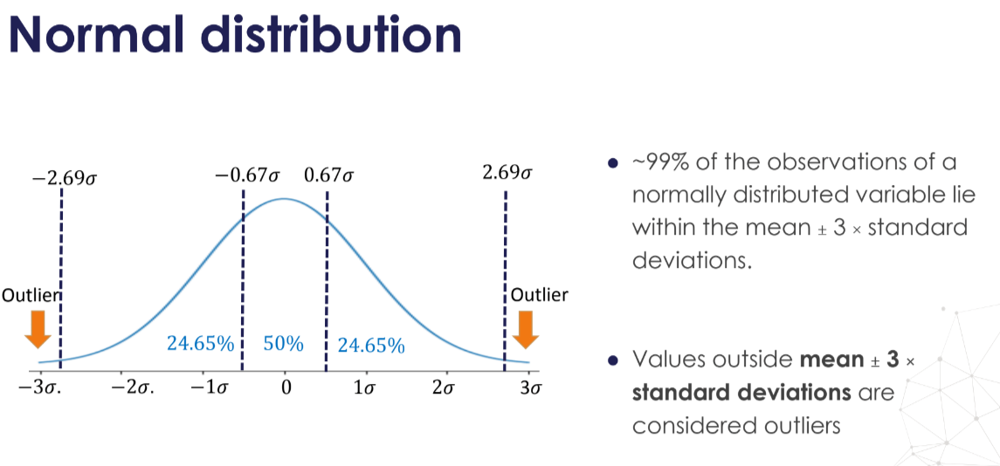

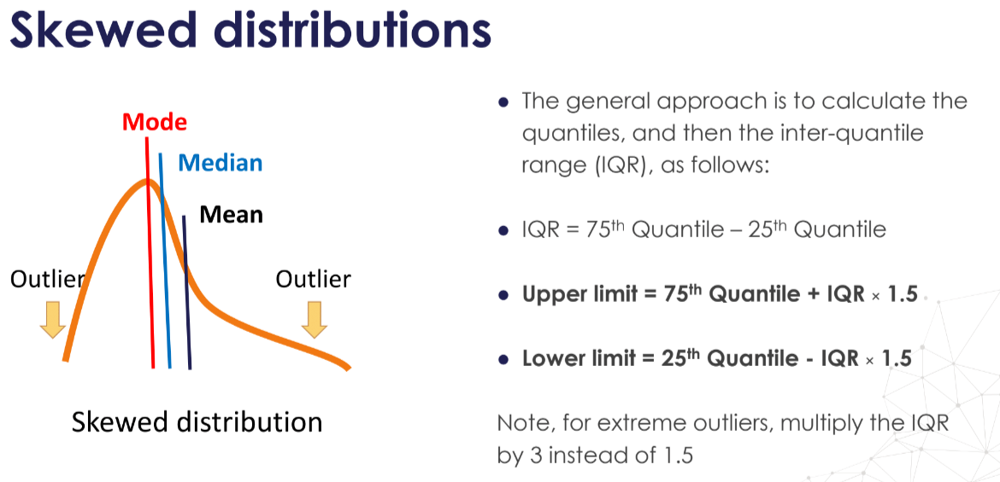

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.datasets import load_breast_cancer

# load the California House price data from Scikit-learn
breast_cancer = load_breast_cancer()
X = pd.DataFrame(breast_cancer.data, columns=breast_cancer.feature_names)
y = breast_cancer.target

# let's separate the data into training and testing sets

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.3,
    random_state=0,
)

X_train.shape, X_test.shape

((398, 30), (171, 30))

In [22]:
X_train.sample(5)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
184,15.28,22.41,98.92,710.6,0.09057,0.10520,0.05375,0.03263,0.1727,0.06317,...,17.80,28.03,113.8,973.1,0.1301,0.3299,0.3630,0.12260,0.3175,0.09772
430,14.90,22.53,102.10,685.0,0.09947,0.22250,0.27330,0.09711,0.2041,0.06898,...,16.35,27.57,125.4,832.7,0.1419,0.7090,0.9019,0.24750,0.2866,0.11550
513,14.58,13.66,94.29,658.8,0.09832,0.08918,0.08222,0.04349,0.1739,0.05640,...,16.76,17.24,108.5,862.0,0.1223,0.1928,0.2492,0.09186,0.2626,0.07048
111,12.63,20.76,82.15,480.4,0.09933,0.12090,0.10650,0.06021,0.1735,0.07070,...,13.33,25.47,89.0,527.4,0.1287,0.2250,0.2216,0.11050,0.2226,0.08486
258,15.66,23.20,110.20,773.5,0.11090,0.31140,0.31760,0.13770,0.2495,0.08104,...,19.85,31.64,143.7,1226.0,0.1504,0.5172,0.6181,0.24620,0.3277,0.10190


In [23]:
X_train.columns

Index(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error', 'fractal dimension error',
       'worst radius', 'worst texture', 'worst perimeter', 'worst area',
       'worst smoothness', 'worst compactness', 'worst concavity',
       'worst concave points', 'worst symmetry', 'worst fractal dimension'],
      dtype='object')

In [24]:
def plot_boxplot_and_hist(data, variable):
    
    # creating a figure composed of two matplotlib.Axes 
    # objects (ax_box and ax_hist)
    
    f, (ax_box, ax_hist) = plt.subplots(
        2, sharex=True, gridspec_kw={"height_ratios": (0.50, 0.85)}
    )

    # assigning a graph to each ax
    sns.boxplot(x=data[variable], ax=ax_box)
    sns.histplot(data=data, x=variable, ax=ax_hist)

    # Remove x axis name for the boxplot
    ax_box.set(xlabel="")
    plt.title(variable)
    plt.show()

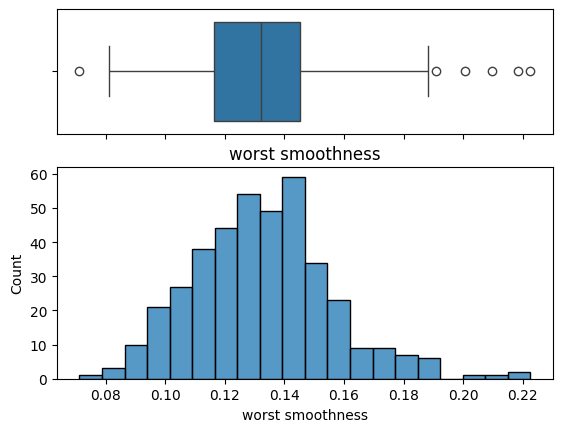

In [30]:
plot_boxplot_and_hist(X_train, "worst smoothness")

In [33]:
def find_limits(df, variable, fold):

    IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)

    lower_limit = df[variable].quantile(0.25) - (IQR * fold)#q1-(IQR*1.5)
    upper_limit = df[variable].quantile(0.75) + (IQR * fold) #q3+(IQR*1.5)
    return lower_limit, upper_limit

In [34]:

lower_limit, upper_limit = find_limits(X_train, "worst smoothness", 1.5)
lower_limit, upper_limit

(0.07283749999999997, 0.18873750000000003)

In [35]:
def find_limits(df, variable):
    lower_limit = X_train[variable].quantile(0.05)
    upper_limit = X_train[variable].quantile(0.95)
    return lower_limit, upper_limit

In [36]:
# we find the limits

lower_limit, upper_limit = find_limits(X_train, "worst smoothness")
lower_limit, upper_limit

(0.0960535, 0.17321499999999998)

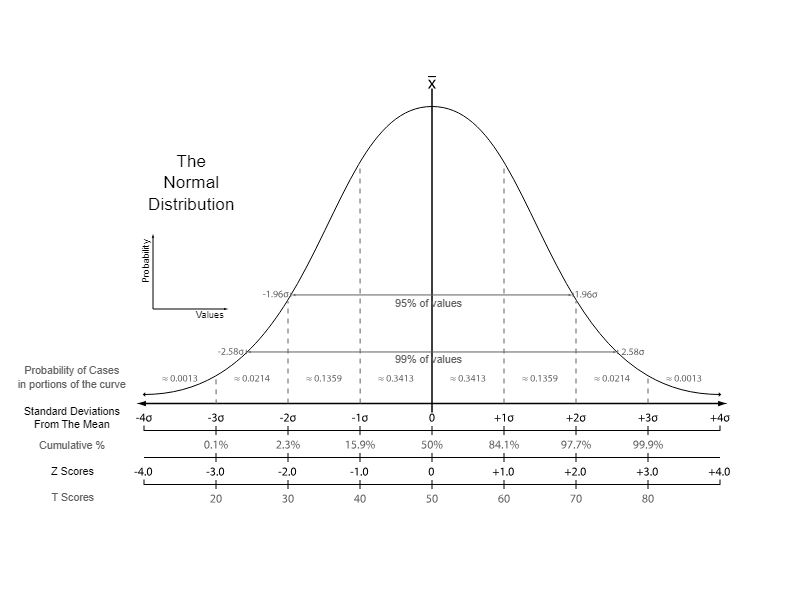

In [39]:
from scipy import stats
import numpy as np

def handle_outliers_z_score(df, variable, threshold=3):
    z_scores = np.abs(stats.zscore(df[variable]))
    return z_scores

z_score = handle_outliers_z_score(X_train, "worst smoothness")

#get p value
p_values = stats.norm.sf(abs(z_score))
len(p_values)

# calculate z score . 2. get p value from z score 3. use p value against alpha = 0.05 and  test hypothesis

'''
N- null 
Alternateull -> values of the feature are within 95% of the CI  -> values of the feature are outside the CI - alternate

p<= 0.05 => reject null
p>0.05 => accept null, fail to reject null
'''


398

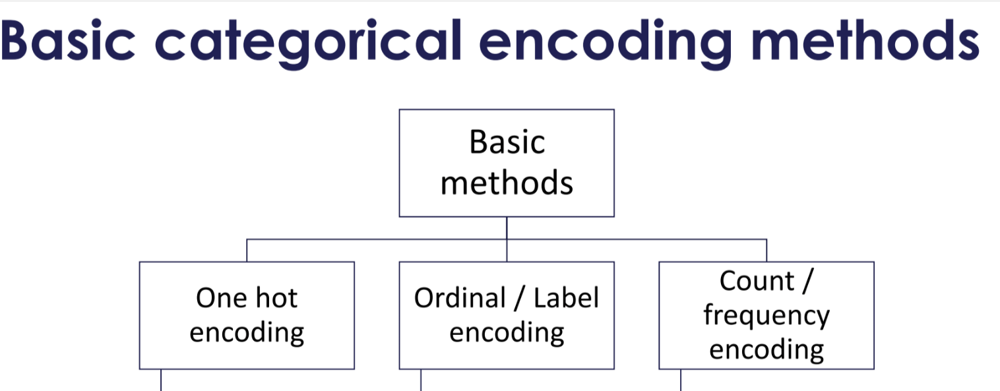

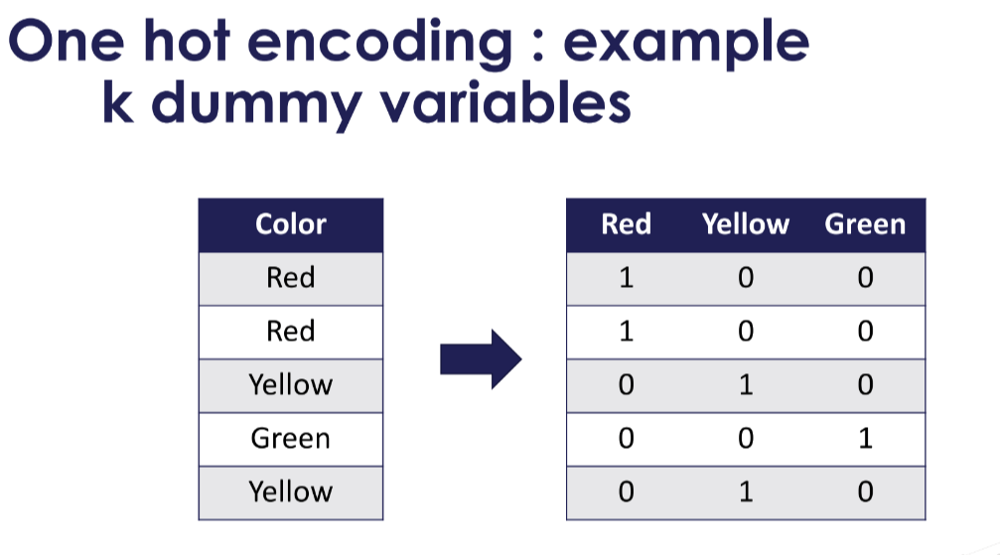

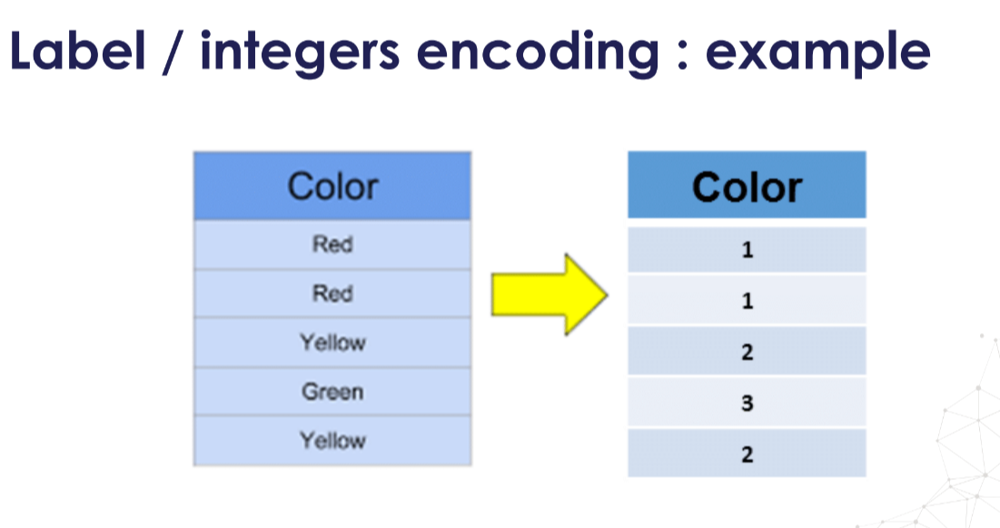

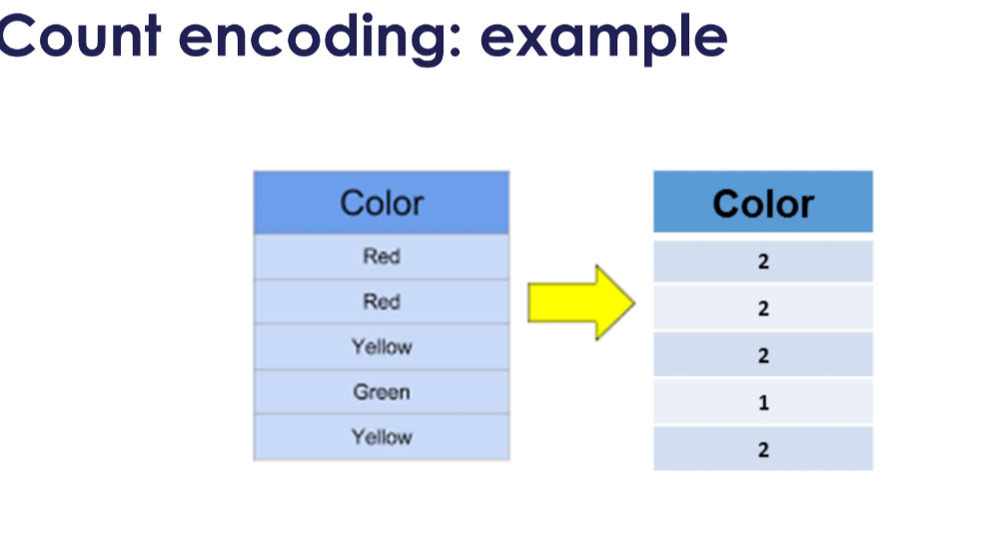

In [40]:
import pandas as pd
from sklearn.model_selection import train_test_split

# sklearn
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder

In [42]:
# load titanic dataset

usecols = ["pclass", "sibsp", "parch", "sex", "embarked", "cabin", "survived"]

data = pd.read_csv("./Datasets/titanic.csv", usecols=usecols)
data["cabin"] = data["cabin"].str[0]

data.head()

,pclass,survived,sex,sibsp,parch,cabin,embarked
0,1,1,female,0,0,B,S
1,1,1,male,1,2,C,S
2,1,0,female,1,2,C,S
3,1,0,male,1,2,C,S
4,1,0,female,1,2,C,S


In [50]:
# set up encoder

encoder = OneHotEncoder(
    categories="auto",
    drop="first",  # to return k-1, use drop=false to return k dummies
    sparse_output=False,
    handle_unknown="error",  # helps deal with rare labels
)

encoder.set_output(transform="pandas")

encoder.fit(data)
X_enc = encoder.transform(data)
display(X_enc.sample(5))
display(encoder.get_feature_names_out())


,pclass_2,pclass_3,survived_1,sex_male,sibsp_1,sibsp_2,sibsp_3,sibsp_4,sibsp_5,sibsp_8,...,cabin_C,cabin_D,cabin_E,cabin_F,cabin_G,cabin_T,cabin_nan,embarked_Q,embarked_S,embarked_nan
890,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
213,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
512,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
101,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
405,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


array(['pclass_2', 'pclass_3', 'survived_1', 'sex_male', 'sibsp_1',
       'sibsp_2', 'sibsp_3', 'sibsp_4', 'sibsp_5', 'sibsp_8', 'parch_1',
       'parch_2', 'parch_3', 'parch_4', 'parch_5', 'parch_6', 'parch_9',
       'cabin_B', 'cabin_C', 'cabin_D', 'cabin_E', 'cabin_F', 'cabin_G',
       'cabin_T', 'cabin_nan', 'embarked_Q', 'embarked_S', 'embarked_nan'],
      dtype=object)

In [52]:
from sklearn.preprocessing import OrdinalEncoder

data = pd.read_csv(
    "./Datasets/houseprice.csv",
    usecols=["Neighborhood", "Exterior1st", "Exterior2nd", "SalePrice"],
)

data.head()

,Neighborhood,Exterior1st,Exterior2nd,SalePrice
0,CollgCr,VinylSd,VinylSd,208500
1,Veenker,MetalSd,MetalSd,181500
2,CollgCr,VinylSd,VinylSd,223500
3,Crawfor,Wd Sdng,Wd Shng,140000
4,NoRidge,VinylSd,VinylSd,250000


In [54]:
for col in data.columns:
    print(col, ": ", len(data[col].unique()), " labels")

Neighborhood :  25  labels
Exterior1st :  15  labels
Exterior2nd :  16  labels
SalePrice :  663  labels


In [56]:
# let's find the categorical variables

cat_vars = list(data.select_dtypes(include="O").columns)
cat_vars

['Neighborhood', 'Exterior1st', 'Exterior2nd']

In [57]:
encoder = OrdinalEncoder(categories = "auto")

ct = ColumnTransformer(
    [("oe", encoder, cat_vars)],
    remainder="passthrough",
)

ct.set_output(transform="pandas")
ct.fit(data)
X_train_enc = ct.transform(data)
X_train_enc.head()

,oe__Neighborhood,oe__Exterior1st,oe__Exterior2nd,remainder__SalePrice
0,5.0,12.0,13.0,208500
1,24.0,8.0,8.0,181500
2,5.0,12.0,13.0,223500
3,6.0,13.0,15.0,140000
4,15.0,12.0,13.0,250000


In [60]:
ct.named_transformers_["oe"].categories_

[array(['Blmngtn', 'Blueste', 'BrDale', 'BrkSide', 'ClearCr', 'CollgCr',
        'Crawfor', 'Edwards', 'Gilbert', 'IDOTRR', 'MeadowV', 'Mitchel',
        'NAmes', 'NPkVill', 'NWAmes', 'NoRidge', 'NridgHt', 'OldTown',
        'SWISU', 'Sawyer', 'SawyerW', 'Somerst', 'StoneBr', 'Timber',
        'Veenker'], dtype=object),
 array(['AsbShng', 'AsphShn', 'BrkComm', 'BrkFace', 'CBlock', 'CemntBd',
        'HdBoard', 'ImStucc', 'MetalSd', 'Plywood', 'Stone', 'Stucco',
        'VinylSd', 'Wd Sdng', 'WdShing'], dtype=object),
 array(['AsbShng', 'AsphShn', 'Brk Cmn', 'BrkFace', 'CBlock', 'CmentBd',
        'HdBoard', 'ImStucc', 'MetalSd', 'Other', 'Plywood', 'Stone',
        'Stucco', 'VinylSd', 'Wd Sdng', 'Wd Shng'], dtype=object)]

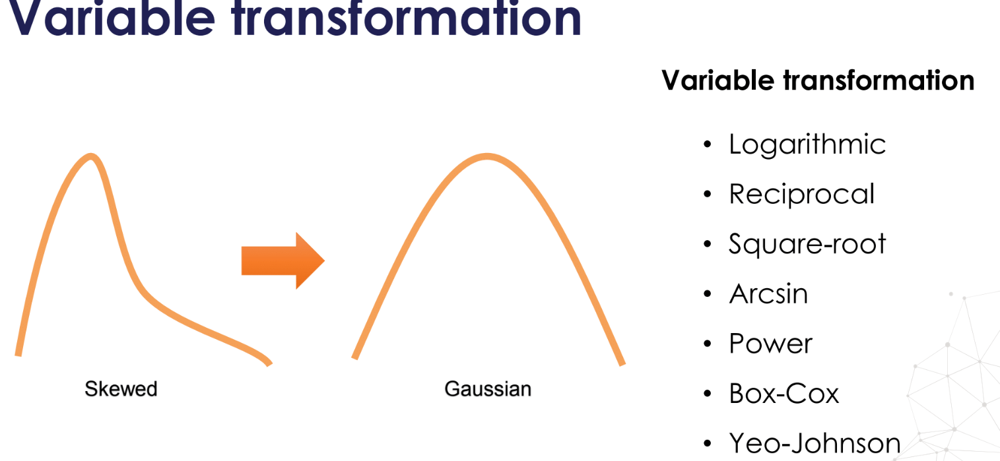

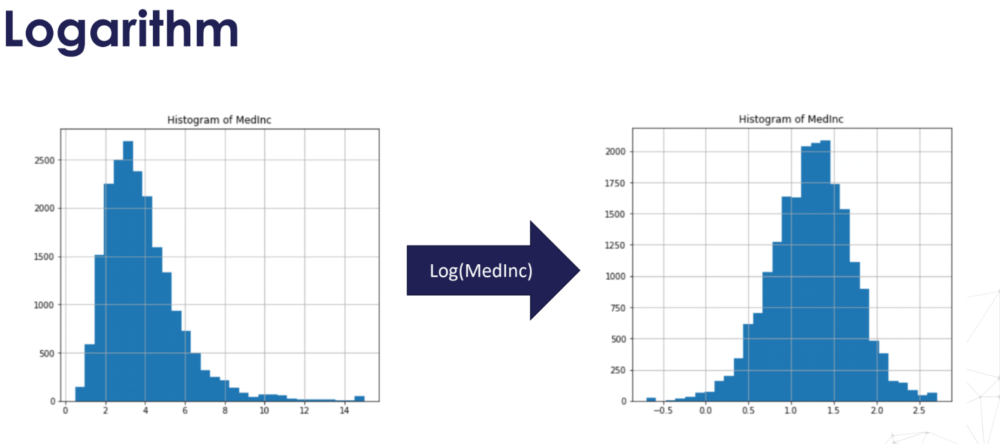

**NOTE**:
- Box Cox transformation Only suitable for positive variables, or those with positive values after adding a constant to them.
- Yeo Johnson Transformation Suitable for both positive or negative variables.
- Yeo Johnson Transformation is more flexible than Box Cox Transformation, as it can transform variables that have 0 or negative values


In [1]:
import numpy as np
import pandas as pd

# for plotting
import matplotlib.pyplot as plt

# for Q-Q plots
import scipy.stats as stats

# the dataset for the demo
from sklearn.datasets import fetch_california_housing

from sklearn.preprocessing import FunctionTransformer

C:\Users\User\AppData\Local\Temp\ipykernel_9452\1545020138.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [5]:
# load the California House price data from Scikit-learn
df = pd.read_csv("./Datasets/housing.csv")
# display top 5 rows
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [6]:
# Plot histogram and Q-Q plots to explore the variable distribution


def diagnostic_plots(df, variable):

    # function to plot a histogram and a Q-Q plot
    # side by side, for a certain variable

    plt.figure(figsize=(15, 6))

    # histogram
    plt.subplot(1, 2, 1)
    df[variable].hist(bins=30)
    plt.title(f"Histogram of {variable}")

    # q-q plot
    plt.subplot(1, 2, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.title(f"Q-Q plot of {variable}")

    plt.show()

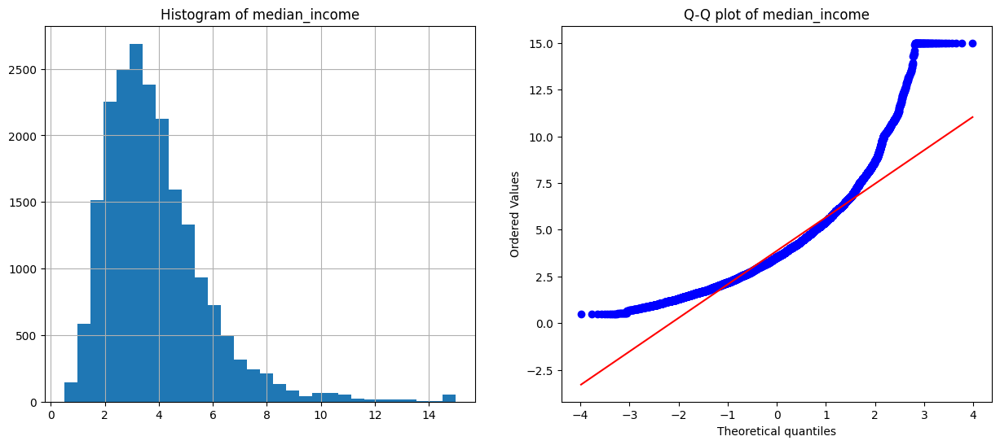

In [7]:

diagnostic_plots(df, "median_income")

In [8]:
df.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity'],
      dtype='object')

In [14]:

variables = ['housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', ]

housing_median_age    float64
total_rooms           float64
total_bedrooms        float64
population            float64
households            float64
median_income         float64
median_house_value    float64
dtype: object


g:\RajArun\BIA\.venv\lib\site-packages\sklearn\preprocessing\_function_transformer.py:192: UserWarning: The provided functions are not strictly inverse of each other. If you are sure you want to proceed regardless, set 'check_inverse=False'.
  warnings.warn(


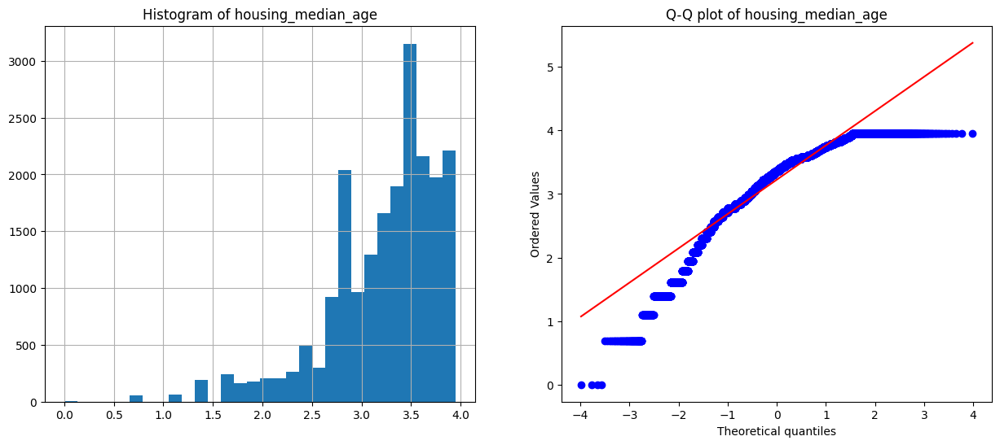

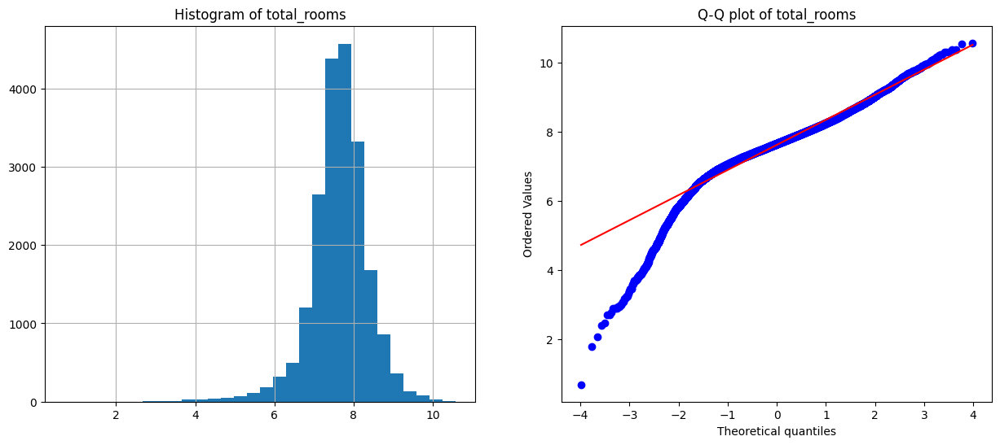

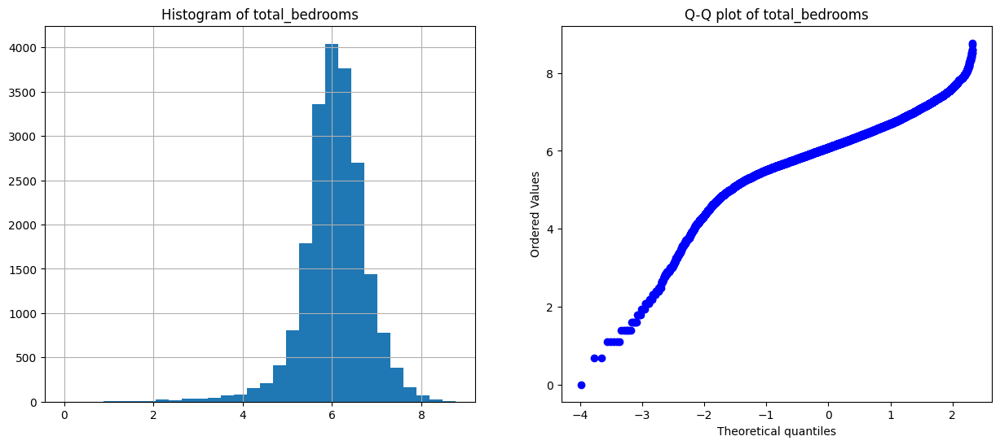

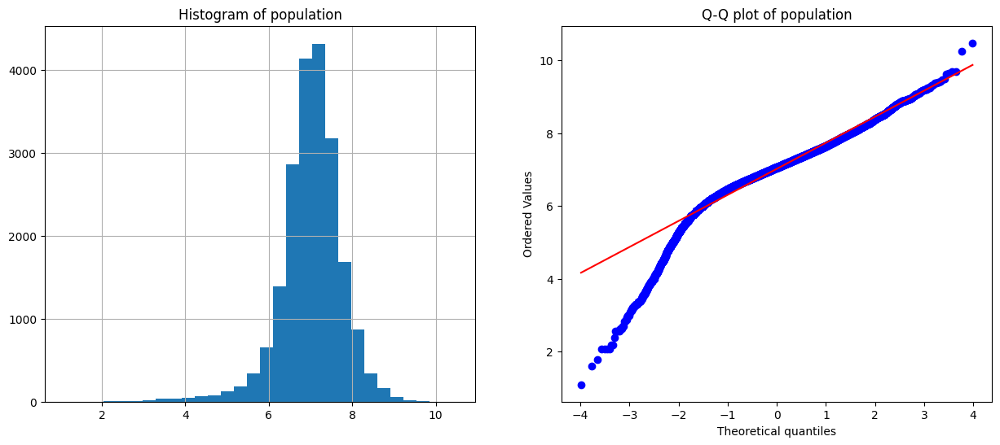

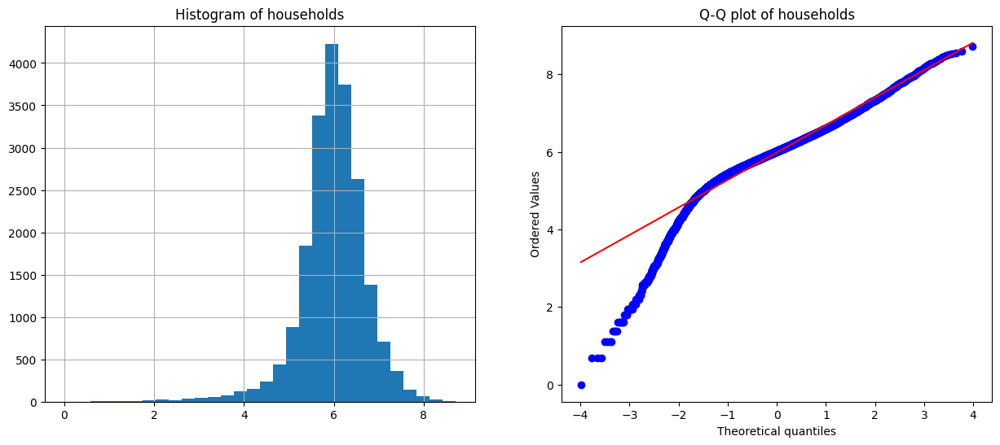

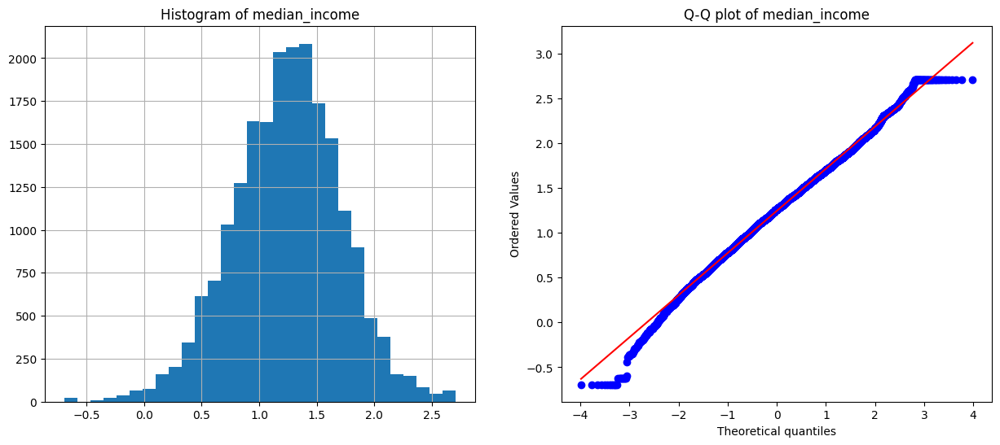

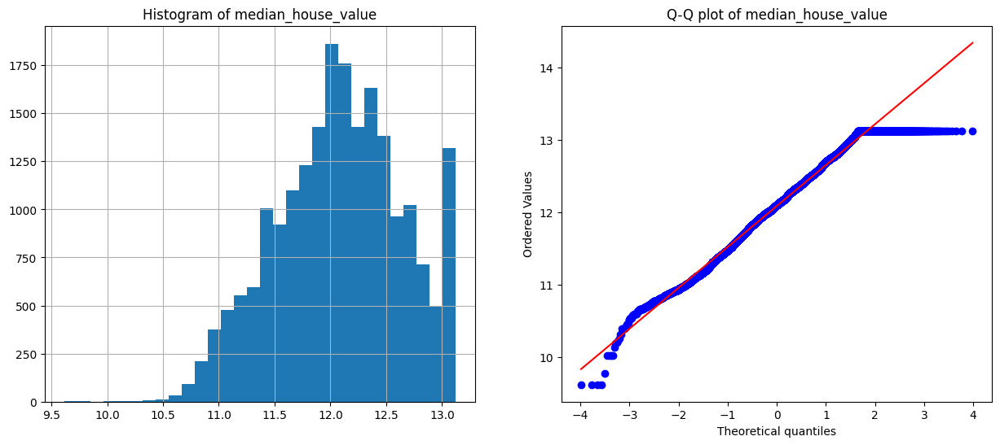

In [15]:
X_tf = df.copy()

print(X_tf[variables].dtypes)
# set up the transformer with NumPy log as parameter

transformer = FunctionTransformer(func=np.log, inverse_func=np.exp)

# fit the transformer to the train set
transformer.fit(X_tf[variables])

# transform the data
X_tf[variables] = transformer.transform(X_tf[variables])

# plot the transformed variables
for var in variables:
    diagnostic_plots(X_tf, var)



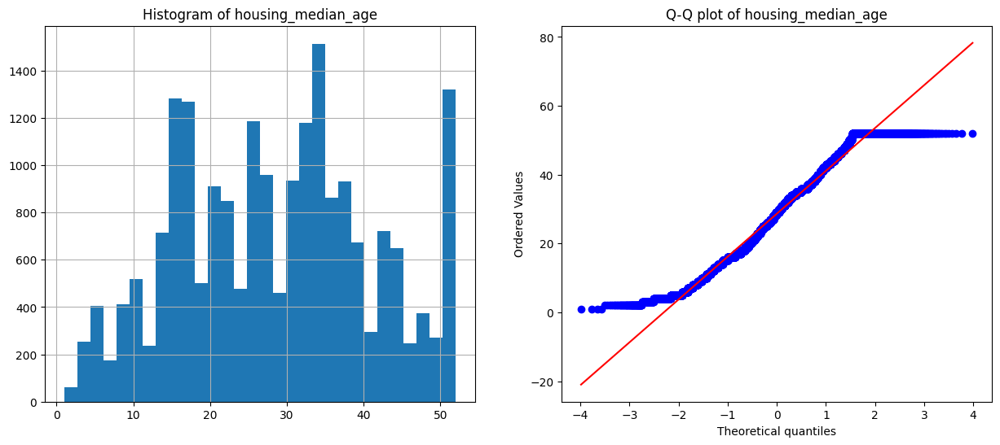

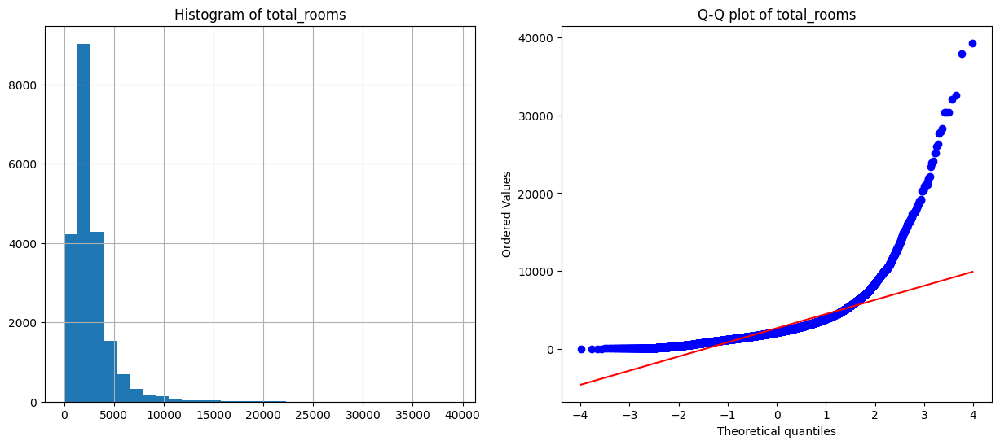

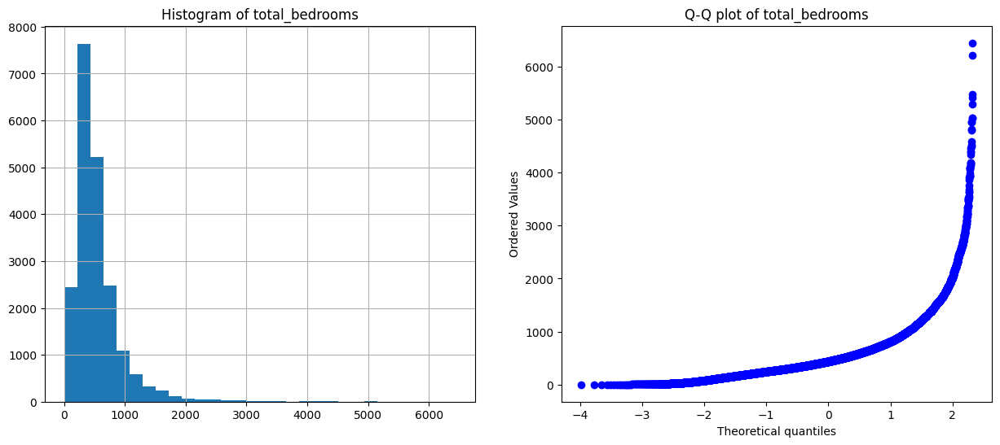

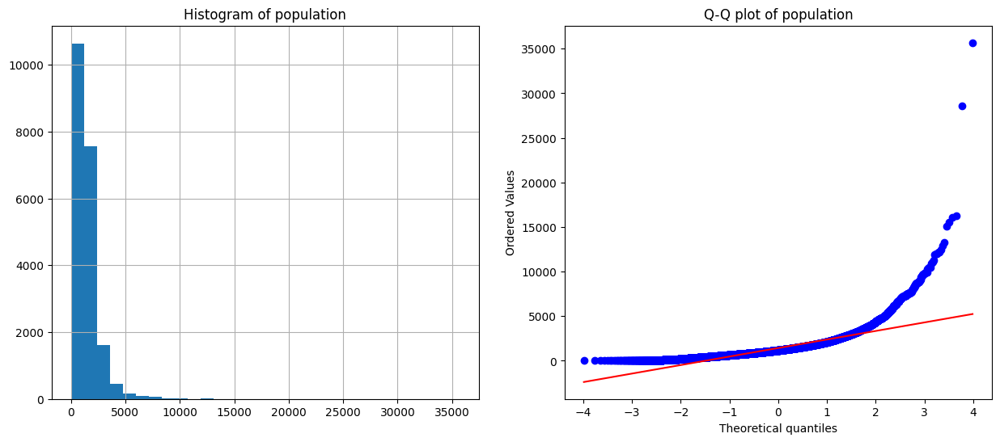

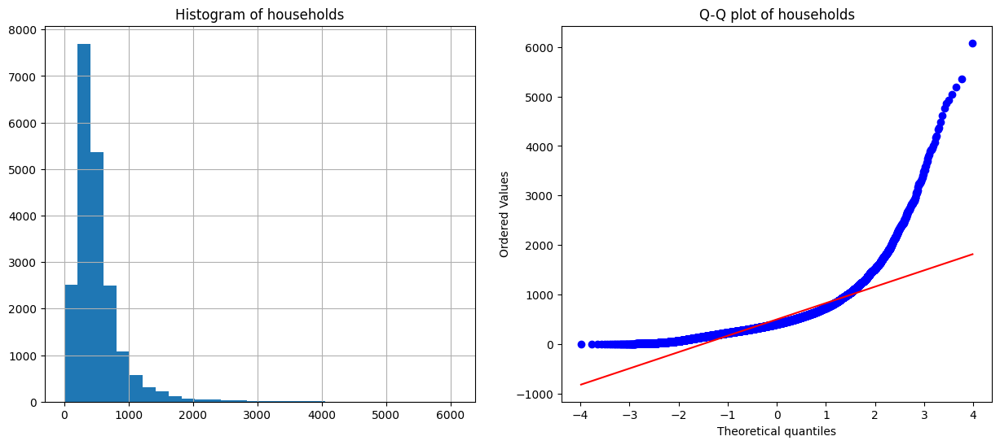

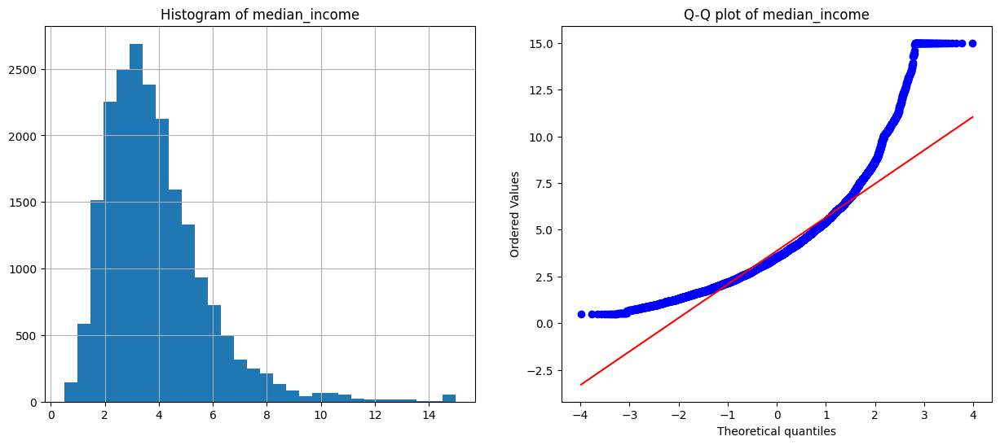

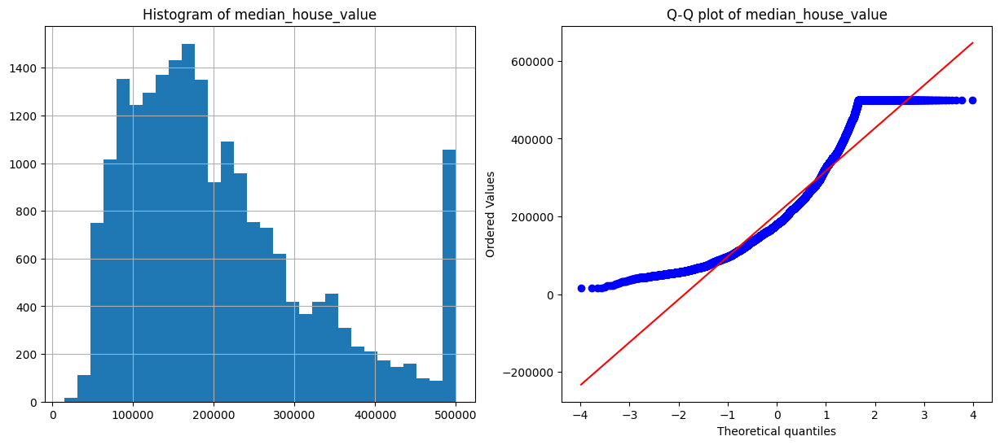

In [16]:
#invert to original scale
X_tf[variables] = transformer.inverse_transform(X_tf[variables])

# plot the transformed variables
for var in variables:
    diagnostic_plots(X_tf, var)

In [19]:
import pandas as pd

# for plotting
import matplotlib.pyplot as plt

# for Q-Q plots
import scipy.stats as stats


# with open-source packages
from sklearn.preprocessing import PowerTransformer



In [ ]:
X.hist(bins=30, figsize=(12, 12), layout=(3, 3))
plt.show()

In [20]:
def make_qqplot(df):

    plt.figure(figsize=(10, 6), constrained_layout=True)

    for i in range(6):

        # location in figure
        ax = plt.subplot(2, 3, i + 1)

        # variable to plot
        var = variables[i]

        # q-q plot
        stats.probplot((df[var]), dist="norm", plot=plt)

        # add variable name as title
        ax.set_title(var)

    plt.show()

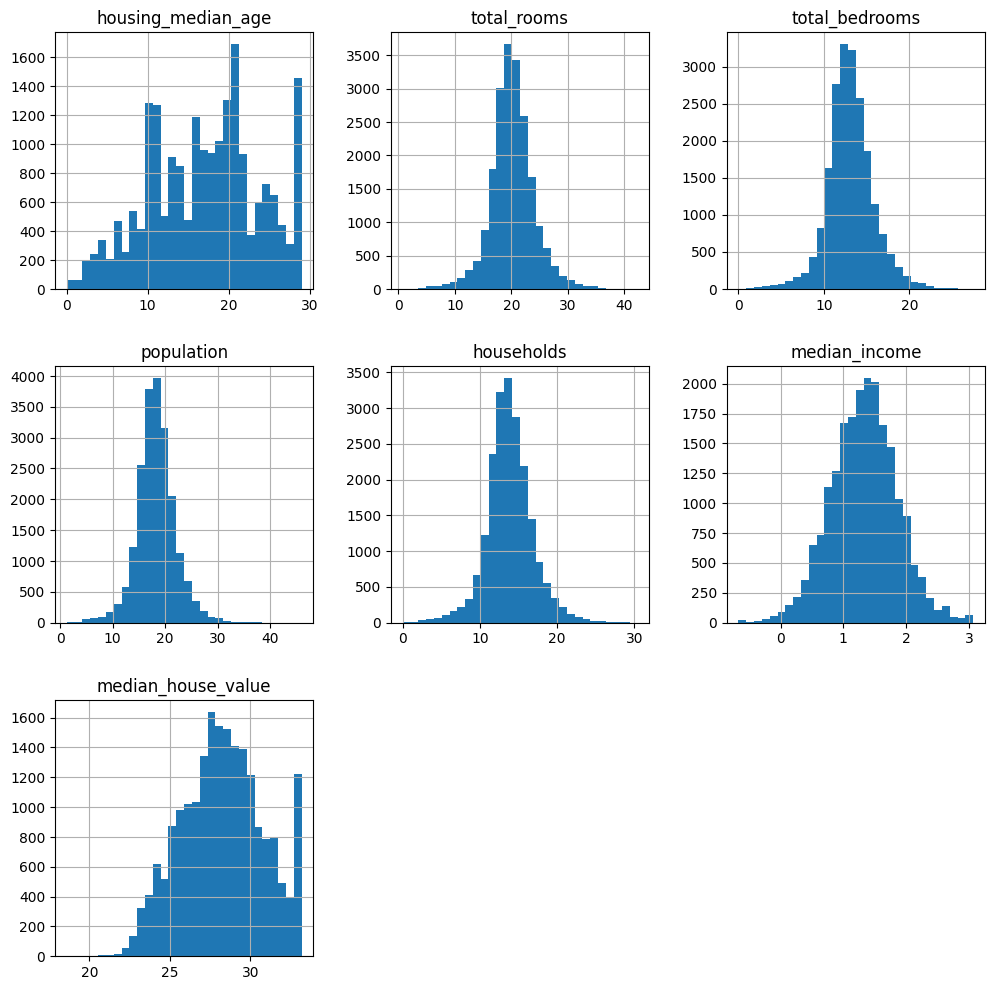

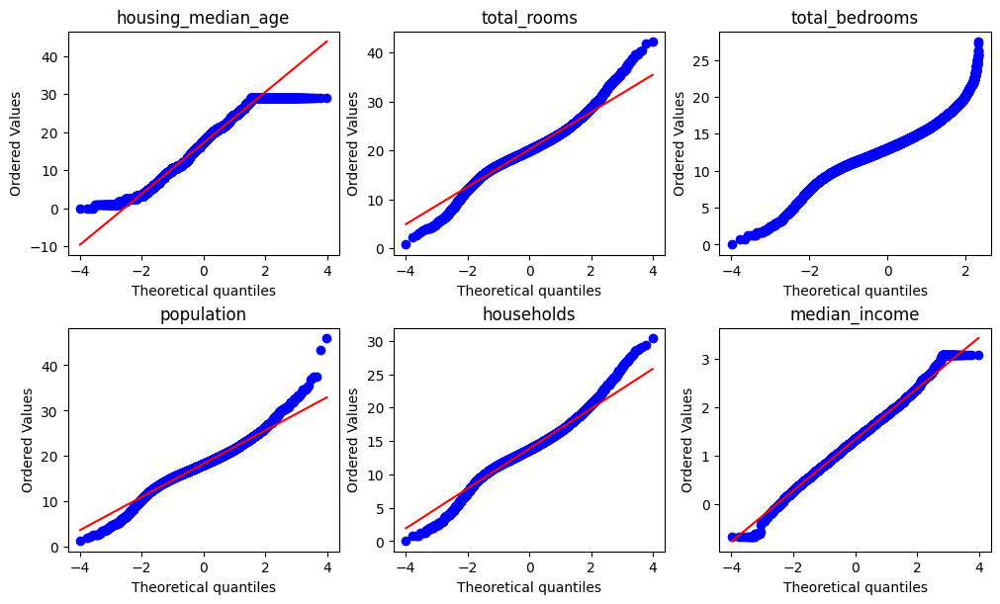

In [21]:
# initialize the transformer with box-cox

transformer = PowerTransformer(method="box-cox", standardize=False)

transformer.set_output(transform="pandas")

# fit the transformer to the train set
transformer.fit(df[variables])

# transform the data
X_tf = transformer.transform(df[variables])

# Plot histograms to inspect variable distributions

X_tf.hist(bins=30, figsize=(12, 12), layout=(3, 3))
plt.show()

# plot the transformed variables
make_qqplot(X_tf)


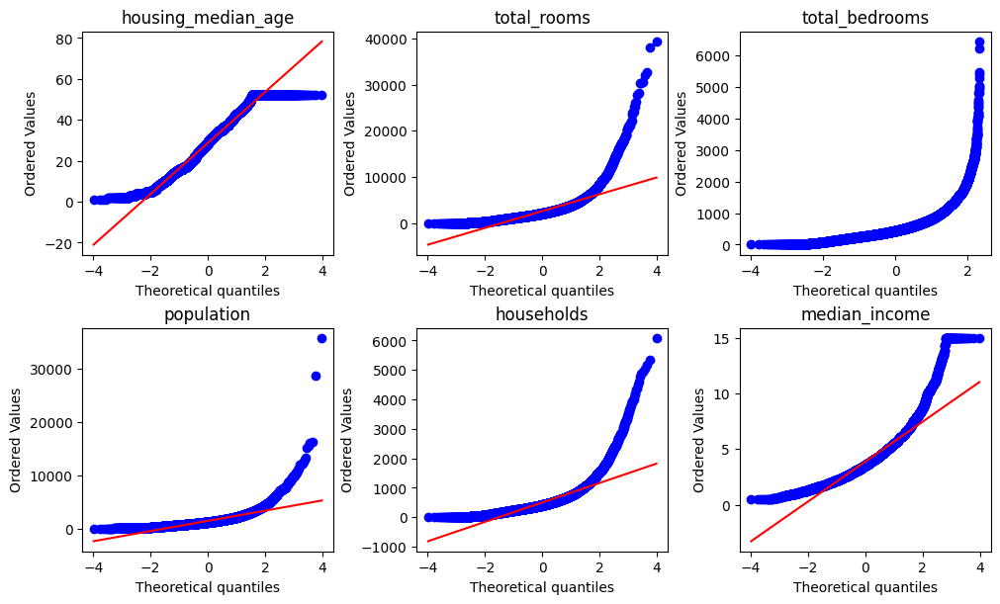

In [22]:
make_qqplot(df[variables])

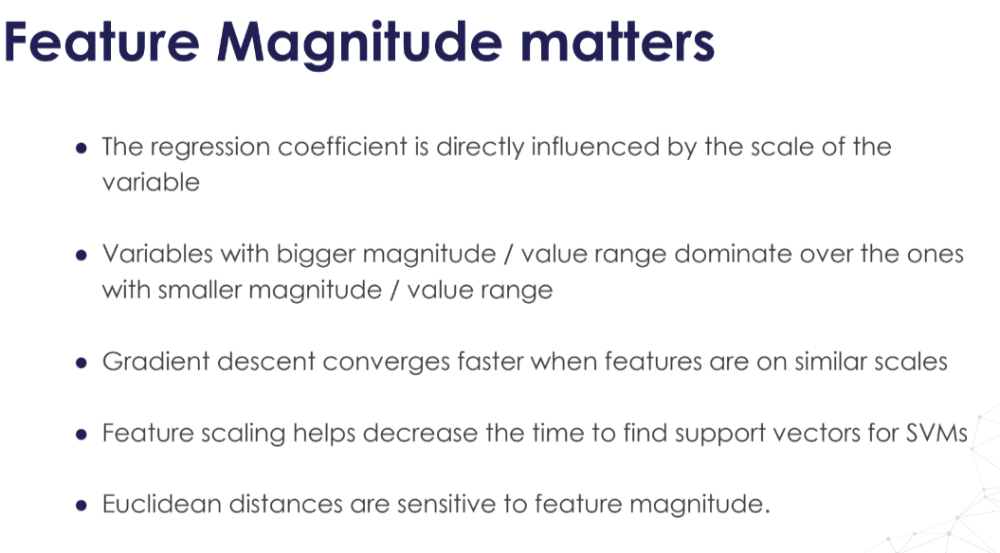

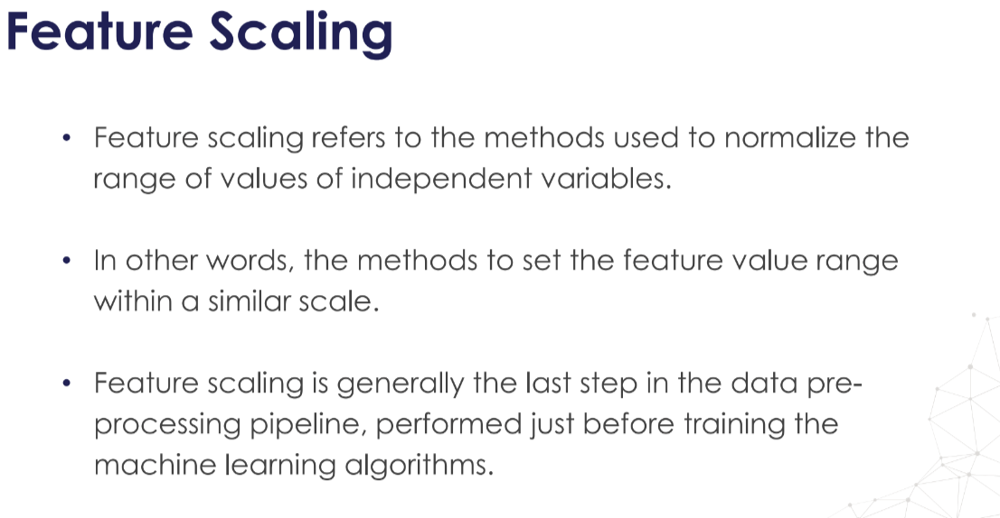

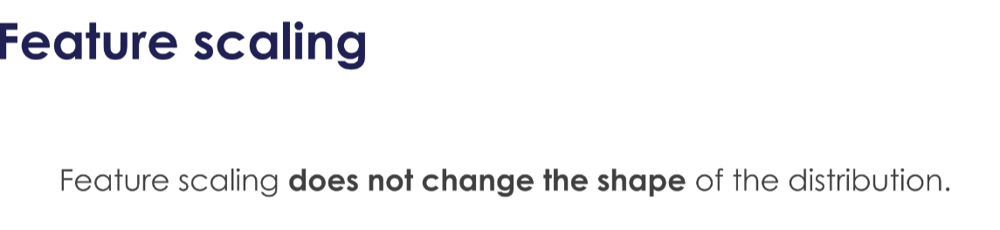

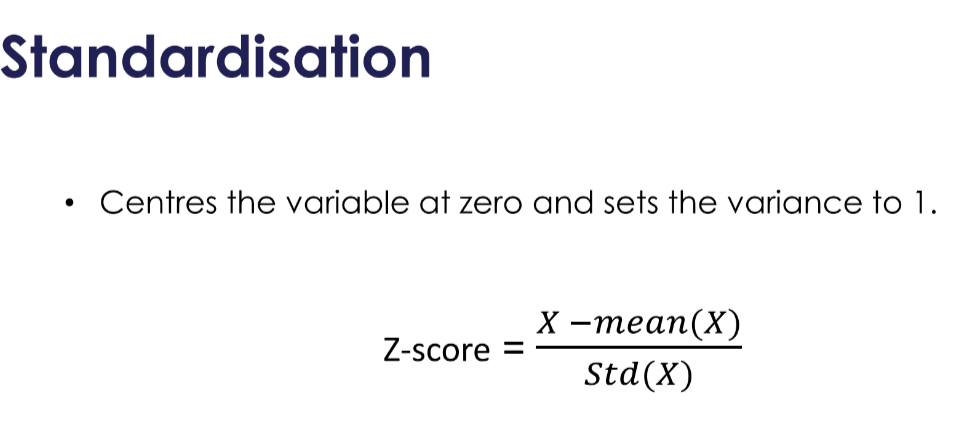

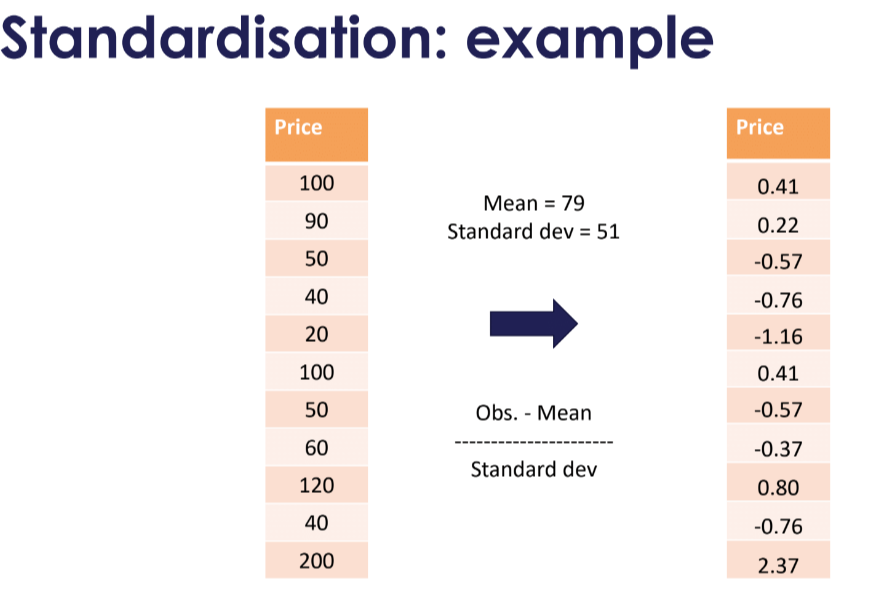

...

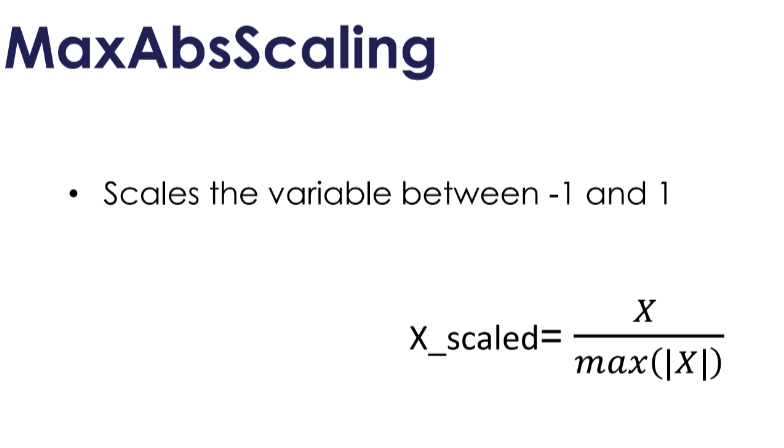

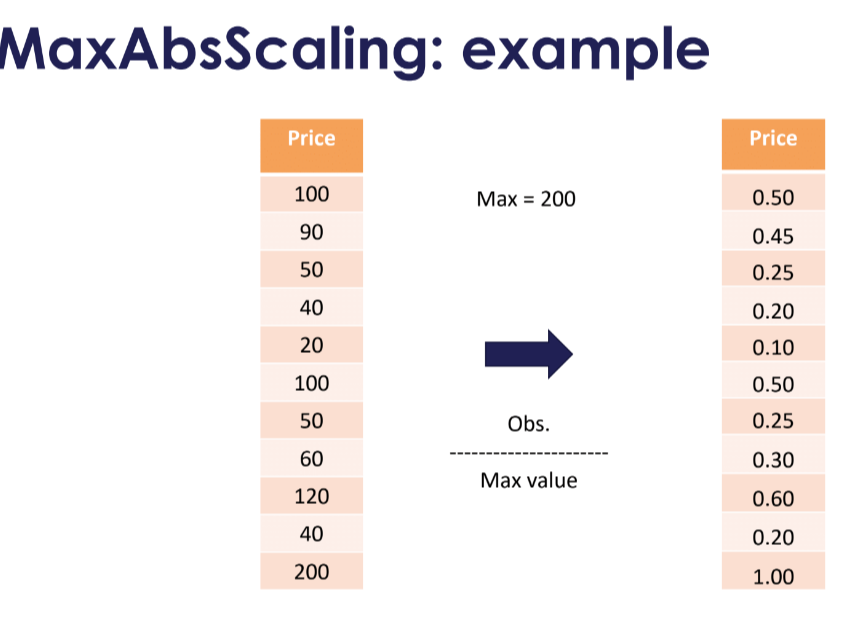

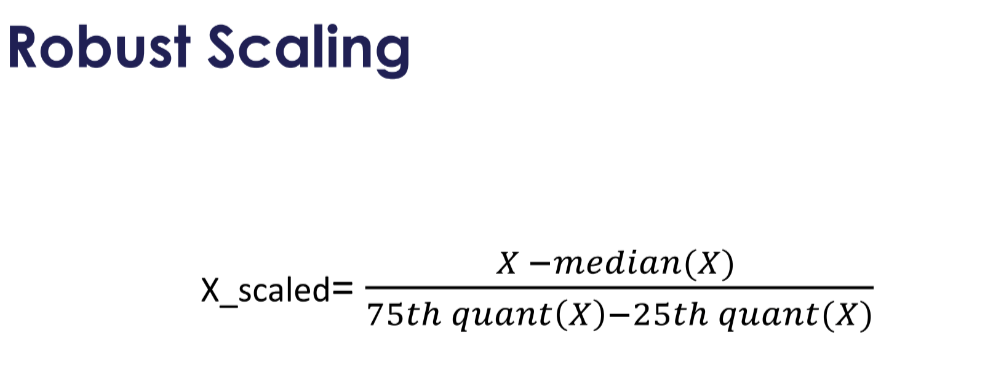

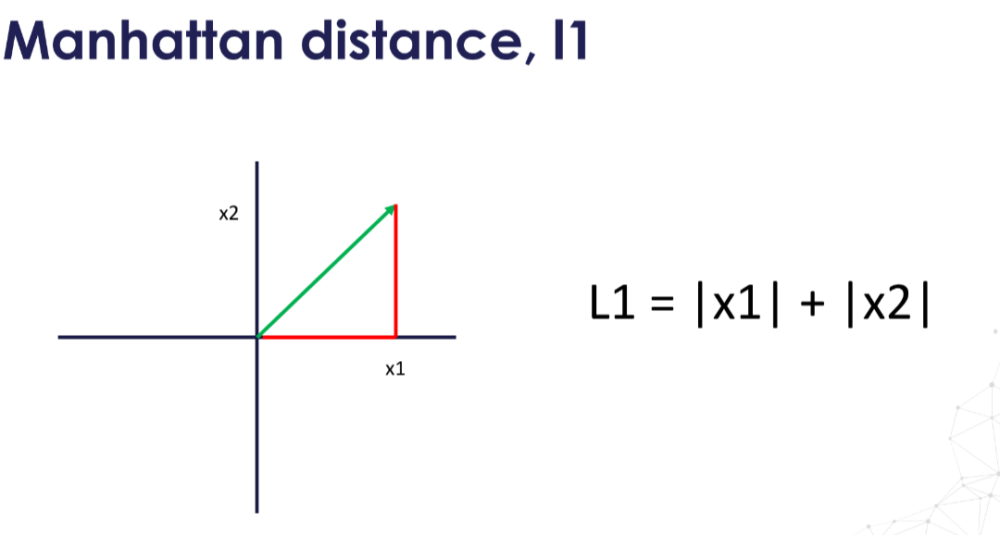

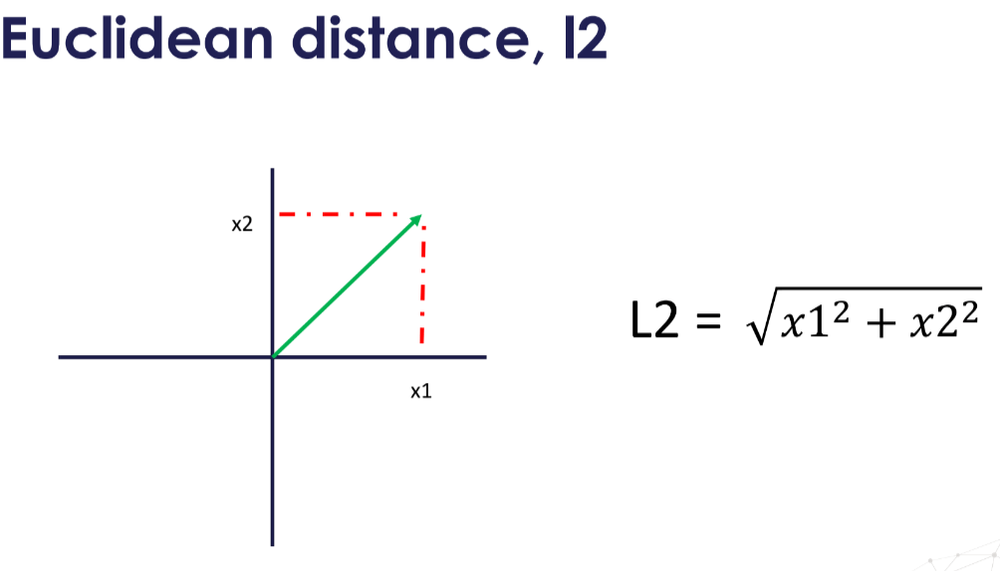

In [23]:
df.sample(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
6986,-118.03,33.97,39.0,1996.0,389.0,1029.0,387.0,4.6500,224300.0,<1H OCEAN
13911,-116.22,34.21,23.0,1175.0,468.0,355.0,151.0,2.2083,42500.0,INLAND
13585,-117.30,34.12,43.0,1018.0,261.0,736.0,215.0,2.6000,66900.0,INLAND
14272,-117.12,32.70,37.0,1361.0,348.0,1398.0,328.0,1.1681,78100.0,NEAR OCEAN
18998,-121.96,38.34,14.0,3035.0,680.0,1597.0,663.0,3.6036,143500.0,INLAND


In [24]:
variables

['housing_median_age',
 'total_rooms',
 'total_bedrooms',
 'population',
 'households',
 'median_income',
 'median_house_value']

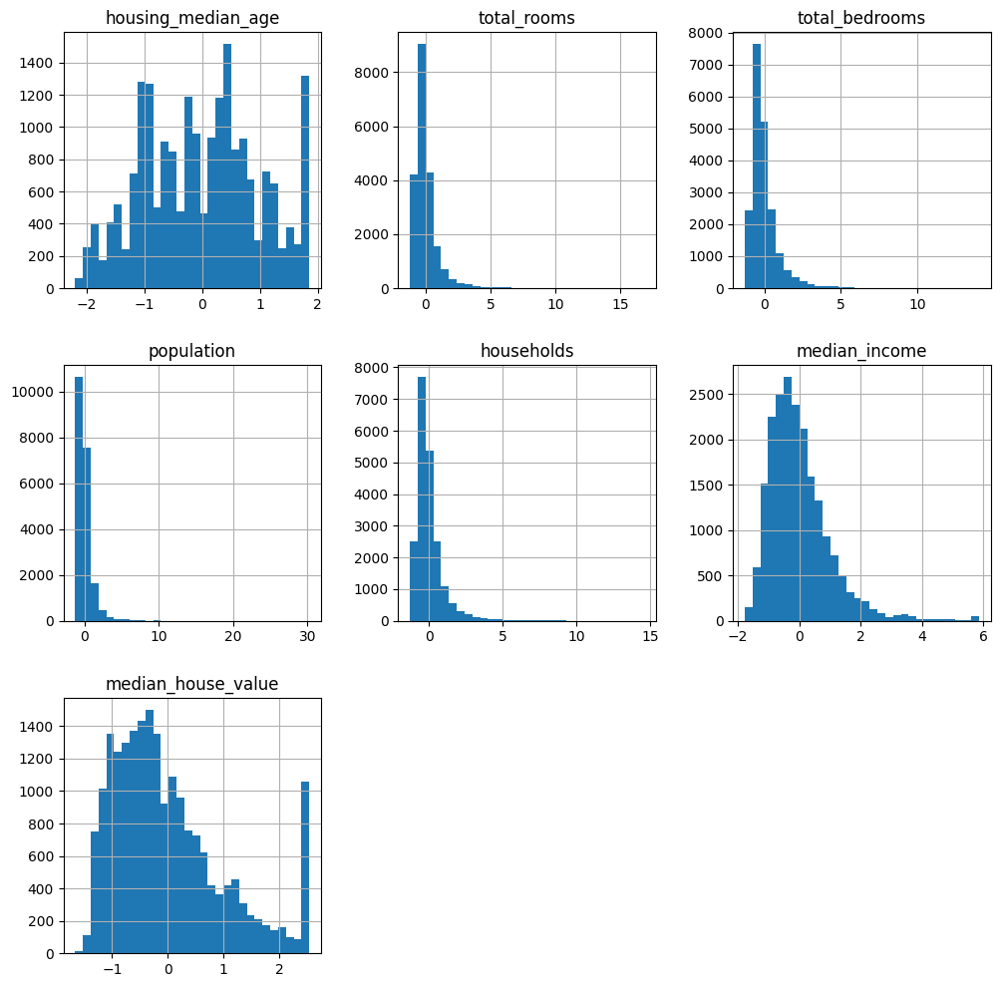

In [27]:
from sklearn.preprocessing import StandardScaler
# set up the scaler
scaler = StandardScaler().set_output(transform="pandas")
df_scaled = scaler.fit_transform(df[variables])

# plot histograms
df_scaled.hist(bins=30, figsize=(12, 12), layout=(3, 3))
plt.show()


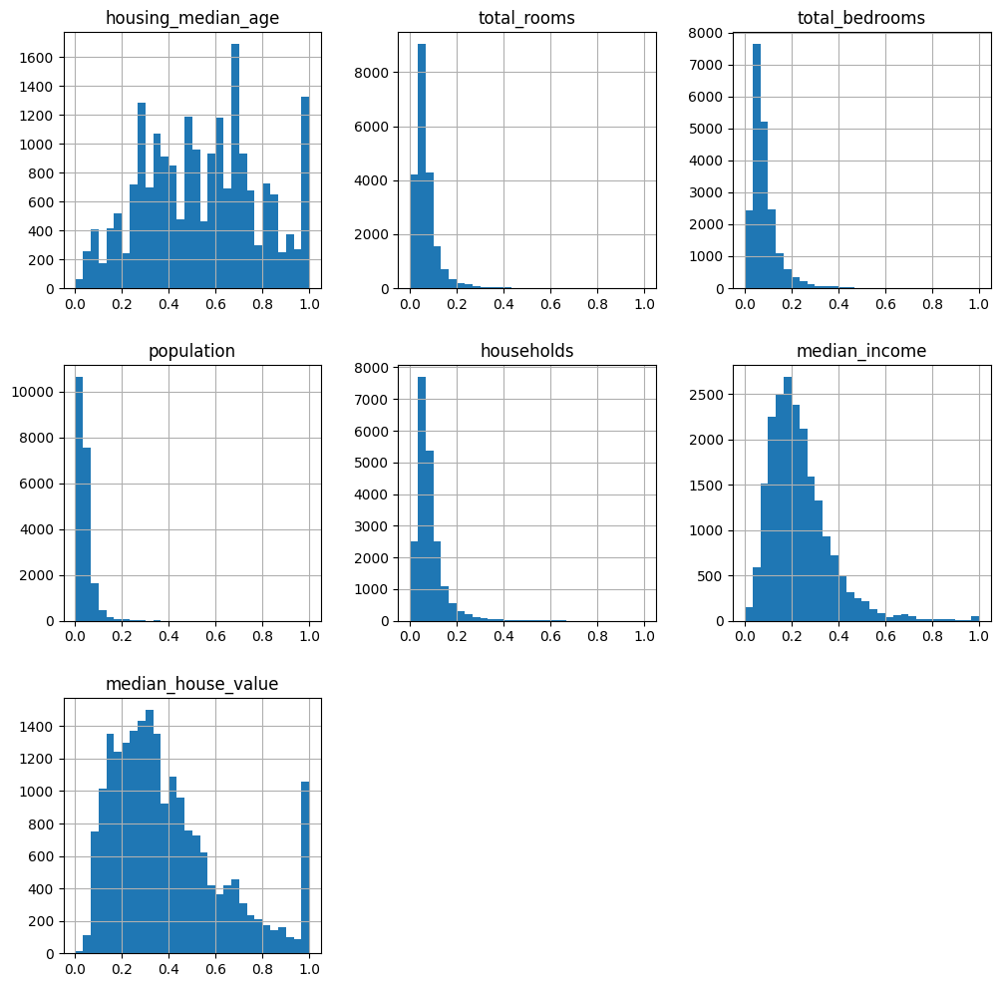

In [29]:
from sklearn.preprocessing import MinMaxScaler

# set up the scaler
scaler = MinMaxScaler().set_output(transform="pandas")
df_scaled = scaler.fit_transform(df[variables])

# plot histograms
df_scaled.hist(bins=30, figsize=(12, 12), layout=(3, 3))
plt.show()

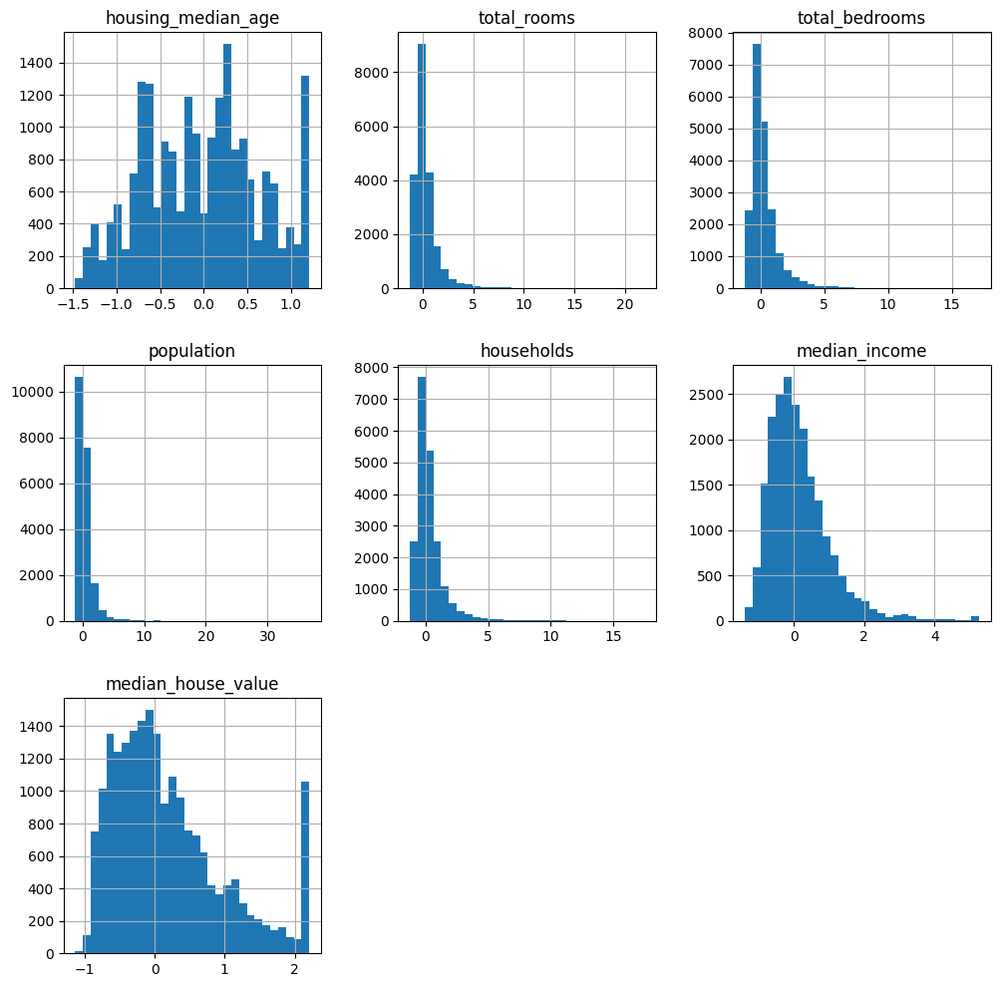

In [31]:
from sklearn.preprocessing import RobustScaler

# set up the scaler
scaler = RobustScaler().set_output(transform="pandas")
df_scaled = scaler.fit_transform(df[variables])

# plot histograms
df_scaled.hist(bins=30, figsize=(12, 12), layout=(3, 3))
plt.show()

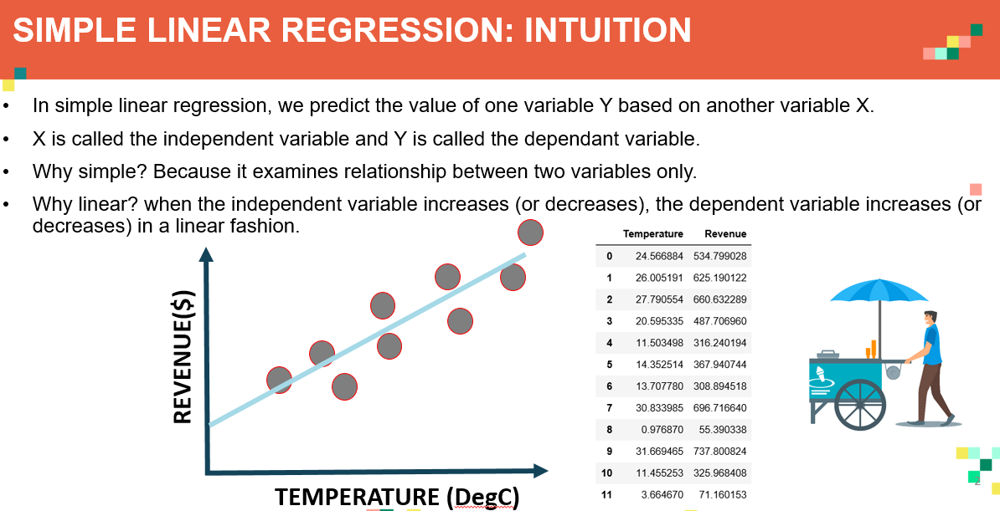

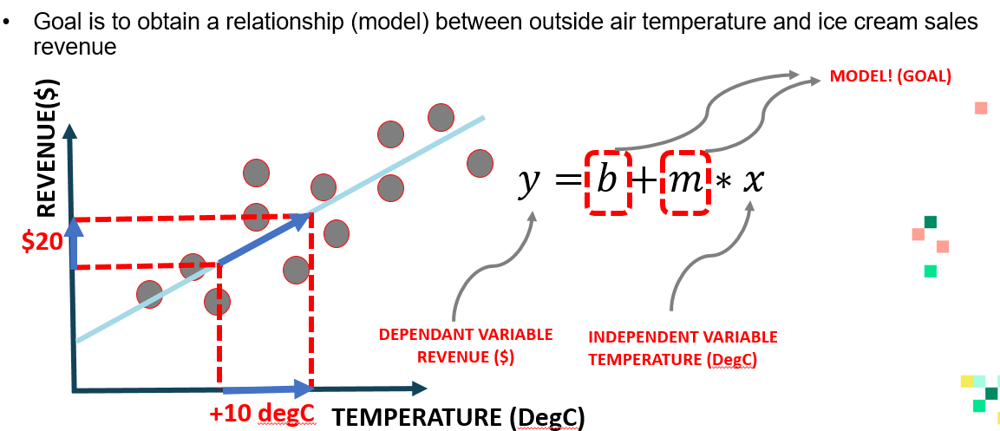

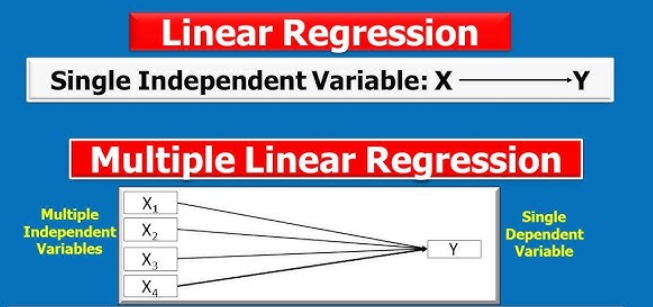

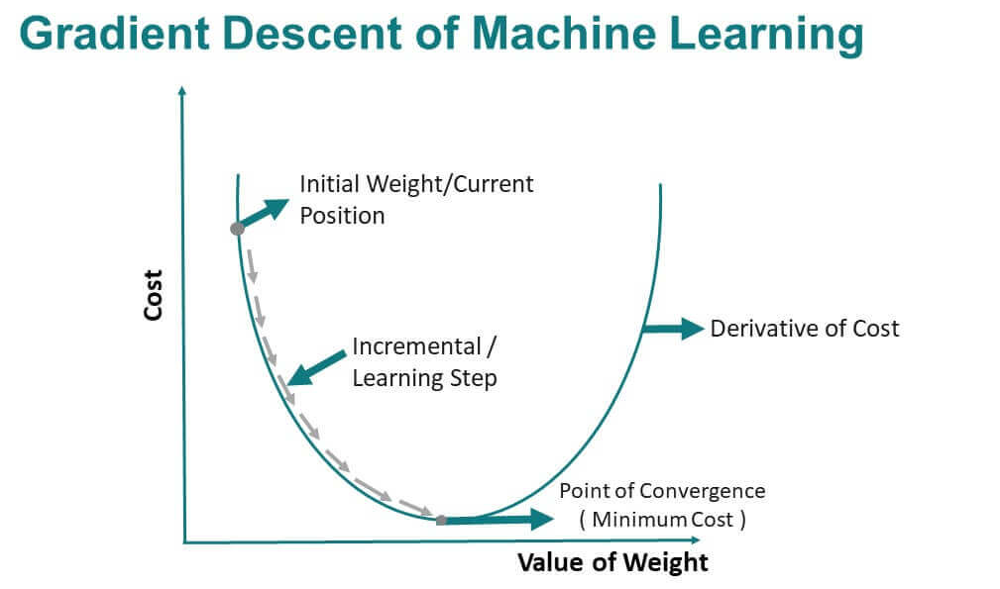


### Functional Perspective:

- **Cost Function:** It's a function that measures the performance of a machine learning model for given data. It quantifies the error between predicted values and expected values and presents it in the form of a single real number.

- **Gradient Descent:** The process used to minimize the cost function by iteratively moving in the direction of the steepest descent as defined by the negative of the gradient.

- **Derivative of Cost (Gradient):** It represents the slope of the cost function at a particular point. In machine learning, this is the amount by which the cost function would change if you changed the model parameters (weights).

### Technical Perspective:

- **Weights:** These are the parameters of the model that are adjusted during training. They determine the influence of input features on the model's predictions.

- **Learning Step:** It's a single iteration of the optimization process. The size of each step is determined by the learning rate, a hyperparameter that controls how much we adjust the weights of our model with respect to the gradient of the loss function.

- **Convergence:** The goal of gradient descent is to converge to the global minimum of the cost function, where the function has the lowest value, which represents the optimal parameters of the model.

### Mathematical Perspective:

- **Slope (Derivative):** Mathematically, the slope at any point on a curve is the derivative of the function at that point. It tells you how steep the curve is at that point.

- **Gradient (Multivariate Derivative):** In a function with multiple variables, the gradient is a vector that represents the direction and rate of the steepest ascent. Conversely, the negative gradient points in the direction of the steepest descent, which is the direction we want to go to minimize the cost function.

- **Update Rule:** The weights are updated by subtracting the product of the learning rate (α) and the derivative of the cost with respect to the weights. This is because the derivative gives the direction of the steepest increase, so we subtract to move in the direction of the steepest decrease (minimization).

Mathematically, the update rule is:

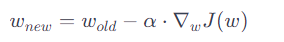

\[ w_{new} = w_{old} - \alpha \cdot \nabla_{w} J(w) \]
where \( \nabla_{w} J(w) \) is the gradient of the cost function with respect to the weights \( w \), and \( \alpha \) is the learning rate.

To summarize, the derivative of the cost with respect to the weights tells us the direction to move in weight space to reduce the cost. The gradient descent algorithm uses this information to iteratively adjust the weights in order to find the minimum of the cost function, ideally corresponding to the best set of model parameters for the machine learning task at hand.


Let's consider a simple example with a single weight parameter to understand the gradient descent update rule. Imagine we have a cost function \( J(w) \) defined as the square of the difference between our model's prediction \( \hat{y}(w) \) and the actual value \( y \). In this case, our model is very simple and just multiplies the input \( x \) by our weight \( w \) to get the prediction:

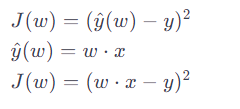


Let's say we have a single data point where \( x = 2 \) and \( y = 4 \), and we initialize our weight \( w \) to 3. We want to update \( w \) to minimize \( J(w) \). We also choose a learning rate \( \alpha = 0.1 \).

### Step 1: Calculate the Gradient

First, we need to find the gradient of \( J(w) \) with respect to \( w \), which is the derivative of \( J(w) \) with respect to \( w \):

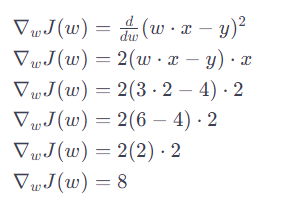

### Step 2: Update the Weight

Now we update \( w \) using the gradient and the learning rate \( \alpha \):

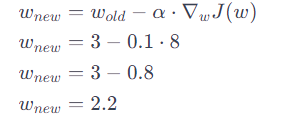

**Closed Form Computation of weights***

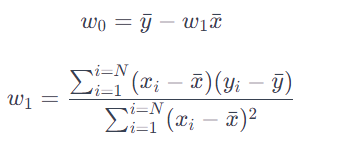

### Step 3: Iterative Process

Gradient descent is an iterative process. So we would repeat Steps 1 and 2 until \( w \) converges to the value that minimizes the cost function. In practice, we would also have more data points and possibly more weights, which would require us to generalize the update rule to handle vectors and matrices, but the principle remains the same.

In this example, after one iteration, our weight \( w \) has been updated from 3 to 2.2, which should bring our prediction \( \hat{y}(w) = w \cdot x \) closer to the actual value \( y = 4 \) when \( x = 2 \). If we were to iterate more, \( w \) should converge to the optimal value of 2 (since \( 2 \cdot 2 = 4 \)), and our cost \( J(w) \) would then be minimized to 0.

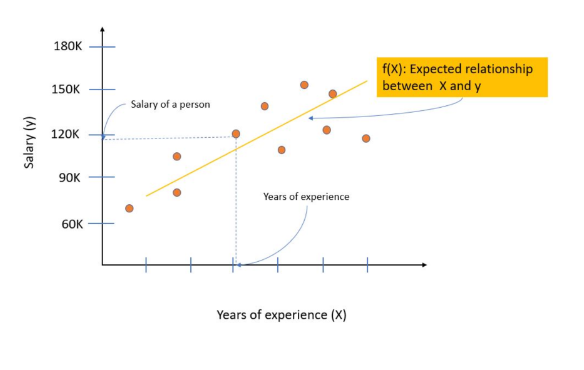


- *y=f(X)+Error*
    - f(x) is the predicted output
        - mx+b
            - m is the slope
            - x is the input feature value
            - b is the bias term
    - Error is the deviation from actual
        - difference between predicted and observed values
    - y is the output/predicted


**Multiple Regression**

- Multiple regression is an extension of simple linear regression. It is defined as a linear regression with multiple features

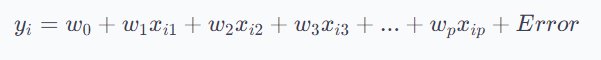

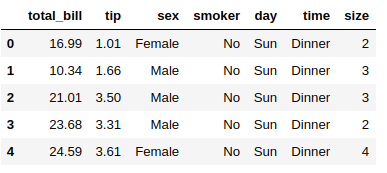

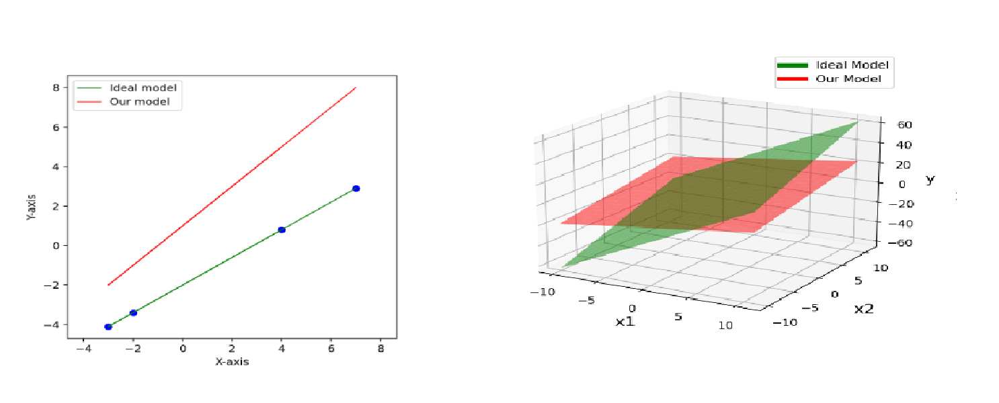

**Sum of Squares Total (SST)**

The Sum of Squares Total (SST) is a measure of the total variability in the data. It's calculated as the sum of the squared differences between each observation and the overall mean.


For example, if you have observations [2, 3, 4, 5] with a mean of 3.5, the SST would be:


SST = (2-3.5)^2 + (3-3.5)^2 + (4-3.5)^2 + (5-3.5)^2 = 2.5


**Sum of Squared Errors (SSE)**

The Sum of Squared Errors (SSE), also known as the residual sum of squares, measures the **unexplained variability** by the model. It's the sum of the squared differences between each observation and its corresponding predicted value.


For example, if the predicted values for the observations [2, 3, 4, 5] are [2.5, 3.5, 3.5, 4.5], the SSE would be:


SSE = (2-2.5)^2 + (3-3.5)^2 + (4-3.5)^2 + (5-4.5)^2 = 1


**Sum of Squares Regression (SSR)**

The Sum of Squares Regression (SSR) measures the **explained variability** by the model. It's the sum of the squared differences between the predicted values and the overall mean.


Continuing with the same example, where the predicted values are [2.5, 3.5, 3.5, 4.5] and the mean is 3.5, the SSR would be:


SSR = (2.5-3.5)^2 + (3.5-3.5)^2 + (3.5-3.5)^2 + (4.5-3.5)^2 = 1


In a regression analysis, the total variability (SST) can be decomposed into the variability explained by the model (SSR) and the unexplained variability (SSE). This relationship is expressed as:


SST = SSR + SSE

**Note**
    
    When the error (SSE) is zero , SST will be equal to SSR

**Important**

    SST = Σ(yi - ȳ)^2 for all i from 1 to n

    SSR = Σ(ŷi - ȳ)^2 for all i from 1 to n

    SSE = Σ(yi - ŷi)^2 for all i from 1 to n

**R-Squared (Coefficient of Determination)**

R-Squared, also known as the coefficient of determination, is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model. It's calculated as the ratio of SSR to SST:


    R-squared = SSR / SST


This tells us the proportion of the total variability that is explained by the model. For example, an R-squared of 0.75 means that 75% of the total variability is explained by the model, and the remaining 25% is unexplained.

#### **Error Types**

**Mean Absolute Error (MAE)**

Mean Absolute Error (MAE) is a measure of errors between paired observations expressing the same phenomenon. It's the average over the verification sample of the absolute values of the differences between forecast and the corresponding observation. The MAE is a linear score which means that all the individual differences are weighted equally in the average.


For example, if you have predicted values [2, 3, 4, 5] and actual values [3, 2, 5, 7], the MAE would be calculated as follows:


MAE = (|2-3| + |3-2| + |4-5| + |5-7|) / 4 = 1


**Mean Squared Error (MSE)**

Mean Squared Error (MSE) is another metric used to measure the performance of a machine learning model. It represents the average of the squared difference between the original and predicted values in the data set. It measures the variance of the residuals.


Continuing with the same example, the MSE would be calculated as follows:


MSE = ((2-3)^2 + (3-2)^2 + (4-5)^2 + (5-7)^2) / 4 = 1.5


**Root Mean Squared Error (RMSE)**

Root Mean Squared Error (RMSE) is the square root of the mean squared error. It measures the standard deviation of the residuals. By taking the square root of the MSE, we end up with a metric that's in the same units as the target variable, which can be easier to interpret.


For the same example, the RMSE would be calculated as follows:


RMSE = sqrt(MSE) = sqrt(1.5) = 1.2247

# LAB

Here's a comprehensive and detailed project template for a machine learning project aimed at predicting California housing prices. This template includes steps for exploratory data analysis (EDA), statistics, preprocessing, feature engineering, modeling, evaluation, and prediction.

**Project Template: California Housing Price Prediction**

1. **Project Setup:**
   - Import required libraries.
   - Load the dataset.

2. **Exploratory Data Analysis (EDA):**
   - Basic data inspection (head, info, describe).
   - Check for missing values.
   - Visualize the distribution of the target variable (housing prices).
   - Examine relationships between features and the target variable using scatter plots, correlation matrices, and pair plots.

3. **Descriptive Statistics:**
   - Calculate central tendency measures (mean, median).
   - Calculate dispersion measures (variance, standard deviation, range, IQR).
   - Identify and visualize outliers using box plots.

4. **Inferential Statistics:**
   - Perform hypothesis testing if applicable (e.g., t-tests, chi-squared tests).
   - Confidence intervals and probability distributions for key statistics.

5. **Data Preprocessing:**
   - Handle missing values (imputation, deletion).
   - Handle duplicated records.

6. **Feature Engineering:**
   - Create new features that could have predictive power (e.g., distance to the nearest city, population density).
   - Feature selection using domain knowledge and statistical tests.

7. **Data Transformation:**
   - Normalize or standardize numerical features.
   - Log-transform skewed features.

8. **Data Encoding:**
   - Encode categorical variables using one-hot encoding or label encoding.

9. **Scaling:**
   - Apply scaling to features (StandardScaler, MinMaxScaler, RobustScaler).

10. **Modeling:**
    - Split the data into training and testing sets.
    - Define a suite of potential models (linear regression, decision tree, random forest, gradient boosting, etc.).
    - Train the models on the training data.

11. **Model Evaluation:**
    - Evaluate models using appropriate metrics (RMSE, MAE, R-squared).
    - Use cross-validation to assess model stability.
    - Feature importance analysis for tree-based models.

12. **Model Tuning:**
    - Perform hyperparameter tuning using techniques like GridSearchCV or RandomizedSearchCV.
    - Validate the tuned model using the test set.

13. **Prediction:**
    - Predict housing prices using the best-performing model.
    - Visualize the predictions against actual values.

14. **Model Interpretability:**
    - Depending on the model you use, it might be valuable to include some interpretation of the model's parameters. This can provide insight into the relationships between the predictors and the outcome variable.

15. **Reporting:**
    - Summarize the findings.
    - Document the model training and evaluation process.
    - Provide recommendations and strategies for operational use.

16. **Deployment:**
    - Prepare the model for deployment (serialization with joblib/pickle).
    - Develop a simple web application for user interaction (optional, using Flask or Streamlit).

17. **Project Closure:**
    - Review project goals and deliverables.
    - Archive code, data, and other materials.
    - Prepare for presentation or sharing results.

Each step in the template would be elaborated upon with specific code and detailed analyses when actually implementing the project. The choice of models, scaling techniques, and feature engineering strategies would depend on the insights gained from the EDA and the nature of the data.

In [135]:
# import pandas as pd

# # Load the dataset
# file_path = '.\Datasets\houseprice.csv'
# data = pd.read_csv(file_path)

# # Displaying the first few rows of the dataset to understand its structure
# data.head()


In [140]:
#inspect dataframe
import pandas as pd

# Load the dataset
file_path = '.\Datasets\housing.csv'
df = pd.read_csv(file_path)

# Displaying the first few rows of the dataset to understand its structure
df.head()




,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [141]:
print("Number of Rows:", df.shape[0])
print("Number of Columns:", df.shape[1])
print("Number of Missing Values:", df.isnull().sum().sum())
print("Number of Unique Values:", df.ocean_proximity.unique())
#duplicate rows
print("Number of Duplicate Rows:", df.duplicated().sum())



Number of Rows: 20640
Number of Columns: 10
Number of Missing Values: 207
Number of Unique Values: ['NEAR BAY' '<1H OCEAN' 'INLAND' 'NEAR OCEAN' 'ISLAND']
Number of Duplicate Rows: 0


In [70]:
df.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

In [142]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [71]:
df.describe(include= "all")

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<1H OCEAN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9136
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909,NaN
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874,NaN
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000,NaN
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000,NaN
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000,NaN
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000,NaN


Distribution for longitude:


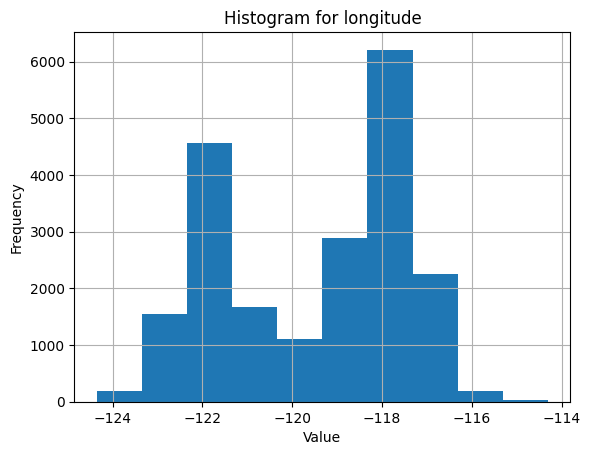



Distribution for latitude:


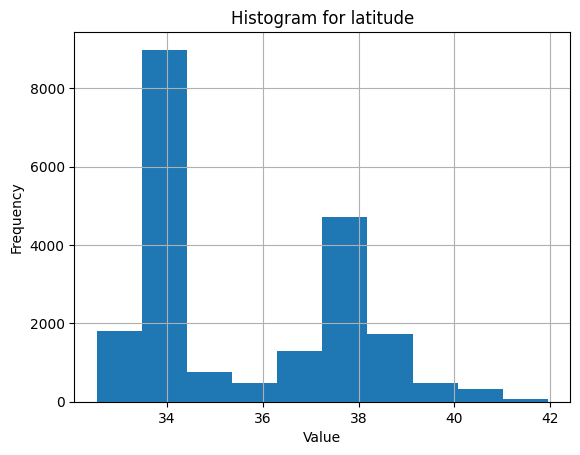



Distribution for housing_median_age:


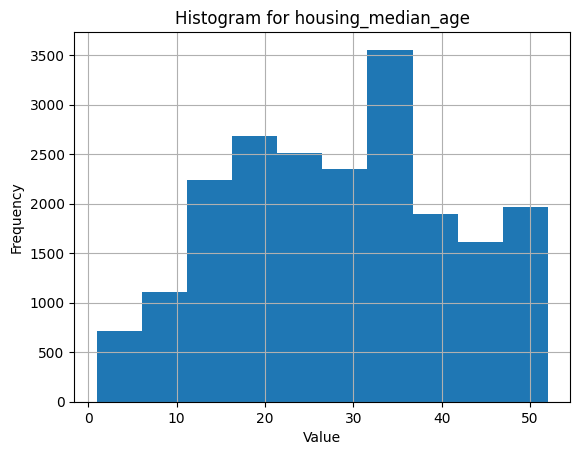



Distribution for total_rooms:


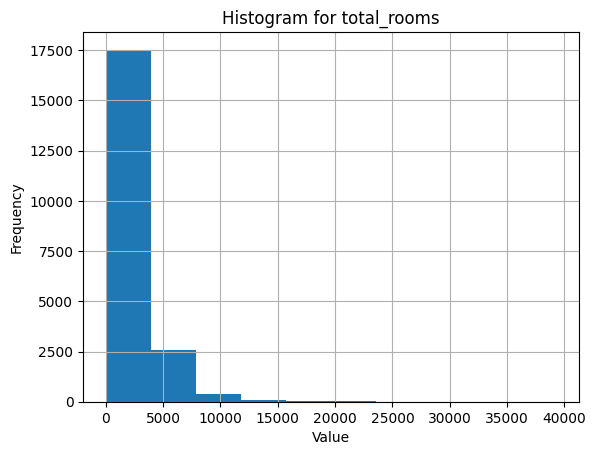



Distribution for total_bedrooms:


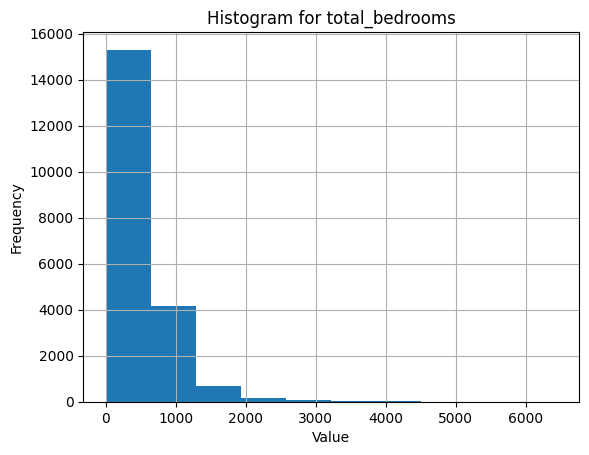



Distribution for population:


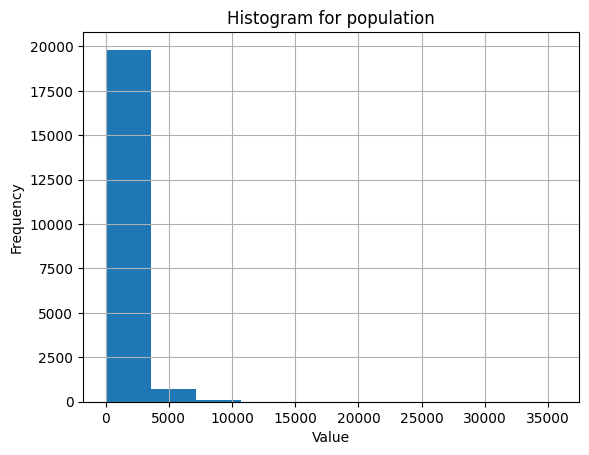



Distribution for households:


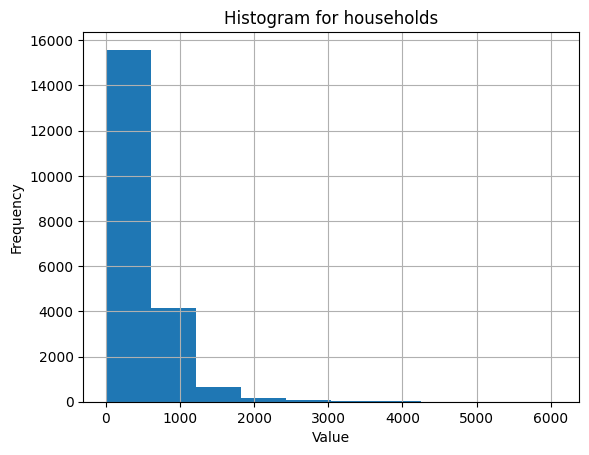



Distribution for median_income:


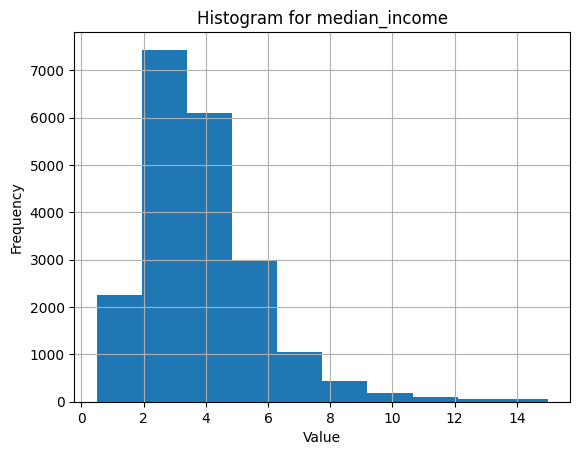



Distribution for median_house_value:


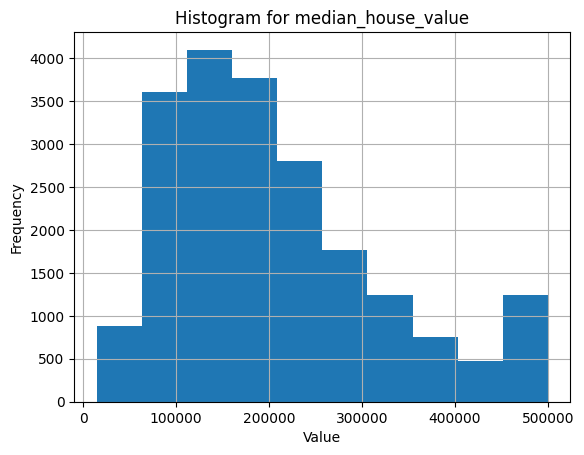



Distribution for ocean_proximity:


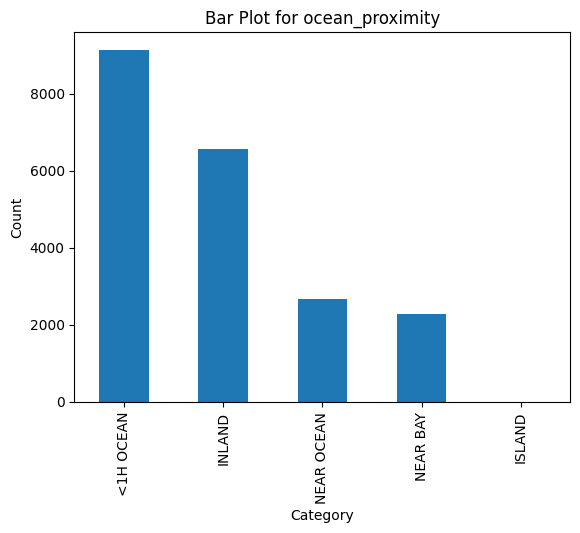

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

def data_distribution(df):
    for col in df.columns:
        print(f"Distribution for {col}:")
        if df[col].dtype == 'object' or df[col].nunique() < 10:
            # For categorical data, we plot a bar plot
            value_counts = df[col].value_counts()
            value_counts.plot(kind='bar')
            plt.title(f'Bar Plot for {col}')
            plt.ylabel('Count')
            plt.xlabel('Category')
            plt.show()
        else:
            # For numerical data, we plot a histogram
            df[col].hist()
            plt.title(f'Histogram for {col}')
            plt.ylabel('Frequency')
            plt.xlabel('Value')
            plt.show()
        print("\n")


data_distribution(df)


Based on the histograms and bar plot you've provided, here are the interpretations and inferences that can be made for each:

1. **Longitude**: The histogram shows two peaks, indicating that there are two regions where the houses are more densely located longitudinally. This might correspond to two major urban areas.

2. **Latitude**: Similar to the longitude, there's a bimodal distribution, suggesting two latitudinal belts where housing is concentrated.

3. **Housing Median Age**: The distribution is fairly uniform but with a slight right skew, indicating that while there is a variety of housing ages, there are more old houses than very new ones. The spikes near the age of 50 may indicate a common age for housing cutoffs or renovations.

4. **Total Rooms**: The data is heavily right-skewed, showing that there are a few districts with a very high number of rooms, while the majority have fewer. This could indicate that most of the housing areas are modestly sized, with a few larger developments or apartment complexes.

5. **Total Bedrooms**: This distribution is also right-skewed, similar to total rooms, which is expected as bedrooms are a subset of rooms. The skewness indicates that most districts have a smaller number of bedrooms.

6. **Population**: The population histogram is highly right-skewed, suggesting that while most districts have a relatively small population, there are a few with a very high population density.

7. **Households**: Again, a right-skewed distribution indicating that most districts have fewer households, with some areas having a significantly higher number of households.

8. **Median Income**: This histogram is slightly right-skewed but closer to a normal distribution than the others. Most districts have a median income in the lower to middle range, with fewer districts having a high median income.

9. **Median House Value**: The distribution shows that the median house value for most districts falls into a moderately high range, with a decrease in frequency as the value increases. There's a noticeable spike at the higher end, which could indicate a cap on house value data.

10. **Ocean Proximity**: The bar plot for `ocean_proximity` shows that the majority of houses are located in areas less than 1 hour from the ocean, with 'INLAND' as the second most common, followed by 'NEAR OCEAN' and 'NEAR BAY', and very few on 'ISLAND'.

These plots provide a visual summary of the various features of the housing data. The skewed distributions for features like total rooms, bedrooms, population, and households suggest the presence of outliers, possibly due to very large or dense housing areas. The median income's more normal distribution could indicate a relatively even economic distribution in this region.

The ocean proximity data suggests that coastal proximity might be a significant factor in this housing dataset, possibly affecting housing prices and desirability. The concentration of data points in certain longitudinal and latitudinal bands suggests geographic clustering of housing data, which could correlate with urban areas. 


In [72]:
df.duplicated().sum()
#no duplicate records

0

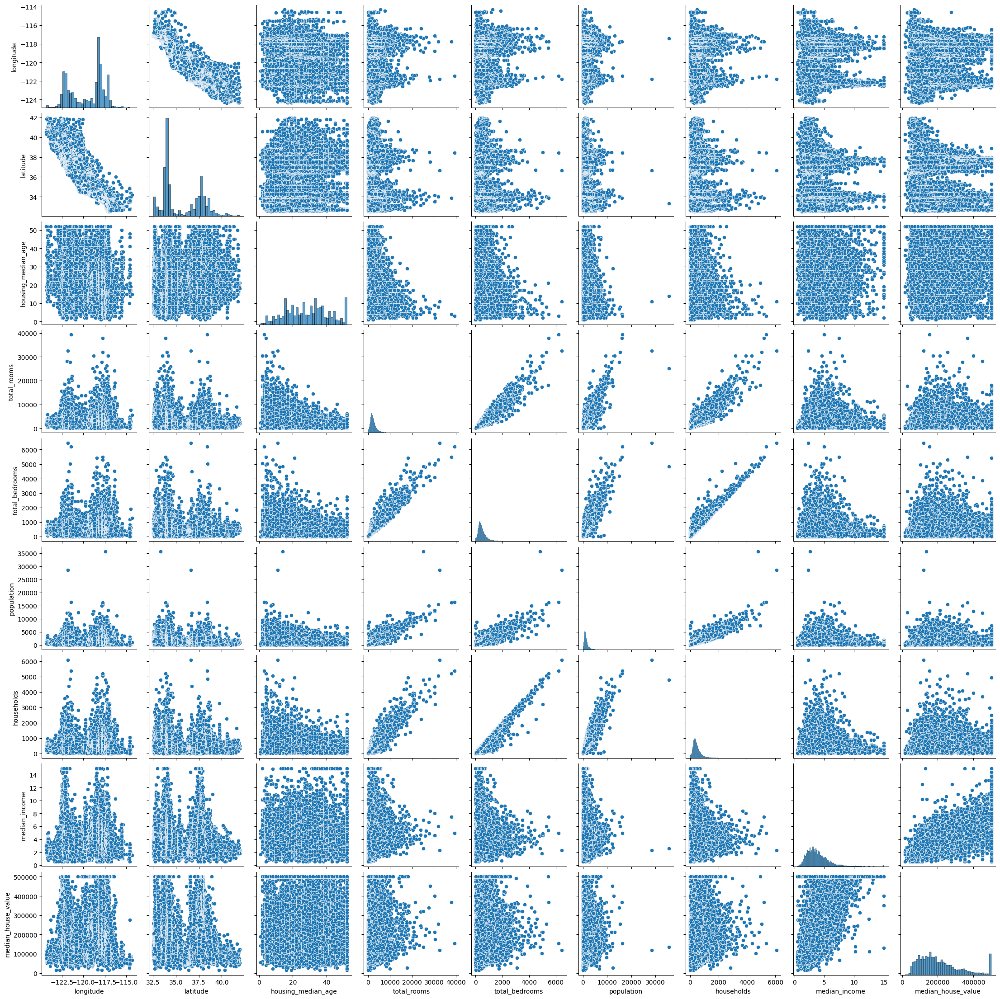

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

# Load your dataset into a DataFrame (replace 'your_data.csv' with your actual data file)
# df = pd.read_csv('your_data.csv')

# Create a pair plot
sns.pairplot(df)
plt.show()


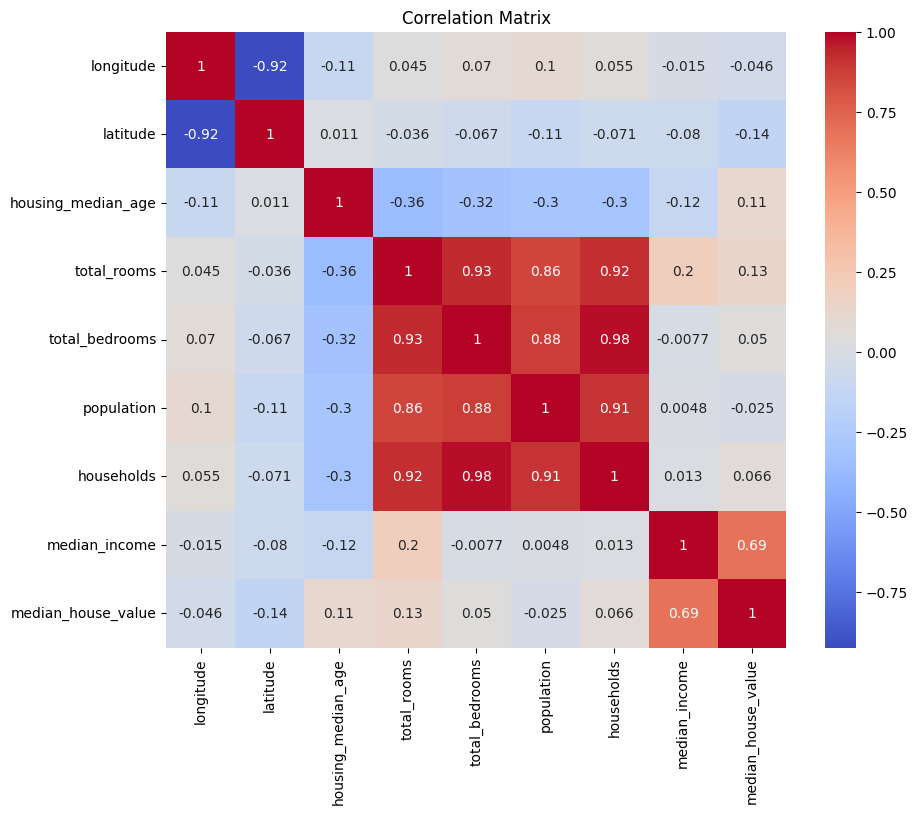

In [73]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your dataset into a DataFrame (replace 'your_data.csv' with your actual data file)
# df = pd.read_csv('your_data.csv')

# Calculate the correlation matrix
correlation_matrix = df.select_dtypes(exclude=["object"]).corr()

# Create a heatmap to visualize the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


In [74]:
# Import necessary libraries
from scipy import stats

# Perform a t-test on 'median_income' and 'median_house_value'
t_stat, p_value = stats.ttest_ind(df['median_income'], df['median_house_value'])

# Null Hypothesis (H0): There is no significant difference between the median income and the median house value.
# Alternative Hypothesis (Ha): There is a significant difference between the median income and the median house value.

t_stat, p_value

#p value is less than 0.05, we reject the null hypothesis.

if p_value <= 0.05:
    print("Reject the null hypothesis")
else:
    print("Fail to reject the null hypothesis")


Reject the null hypothesis


In [75]:
# Hypothesis test on 'housing_median_age' and 'median_house_value'
housing_median_age = df['housing_median_age']
median_house_value = df['median_house_value']

t_stat, p_val = stats.ttest_ind(housing_median_age, median_house_value)
t_stat, p_val

#H0 -> there is no significant difference between median and house value
#H1 -> there is significant difference between median and house value


#0.0 < 0.05
#Reject H0
#There is significant difference between median and house value



(-257.49757280462535, 0.0)

In [76]:
# Load the data
import pandas as pd

# Hypothesis test on 'total_rooms' and 'population'
total_rooms = df['total_rooms']
population = df['population']

t_stat, p_val = stats.ttest_ind(total_rooms, population)
t_stat, p_val


(70.73846821346797, 0.0)

In [77]:
df.sample(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
19792,-123.28,40.77,25.0,767.0,206.0,301.0,121.0,1.6250,79200.0,INLAND
18700,-122.34,40.58,7.0,4843.0,992.0,2223.0,932.0,3.0549,101700.0,INLAND
673,-122.17,37.70,24.0,1755.0,365.0,952.0,362.0,4.0000,202600.0,NEAR BAY
3443,-118.41,34.25,19.0,280.0,84.0,483.0,87.0,1.9500,137500.0,<1H OCEAN
17840,-121.89,37.44,8.0,2534.0,NaN,1527.0,364.0,7.8532,422800.0,<1H OCEAN


In [78]:
import pandas as pd
from scipy.stats import pearsonr

# Load your dataset into a DataFrame (replace 'your_data.csv' with your actual data file)
# df = pd.read_csv('your_data.csv')

# Calculate the Pearson correlation coefficient and p-value
correlation_coefficient, p_value = pearsonr(df['median_income'], df['median_house_value'])

# Define the significance level (alpha)
alpha = 0.05

# Print the results
print("Pearson Correlation Coefficient:", correlation_coefficient)
print("P-value:", p_value)

# Hypothesis statements
if p_value <= alpha:
    print("Hypothesis: There is a significant correlation between median income and median house value.")
else:
    print("Hypothesis: There is no significant correlation between median income and median house value.")


Pearson Correlation Coefficient: 0.688075207958547
P-value: 0.0
Hypothesis: There is a significant correlation between median income and median house value.


In [79]:
import pandas as pd
from scipy.stats import chi2_contingency

# Load your dataset into a DataFrame (replace 'your_data.csv' with your actual data file)
# df = pd.read_csv('your_data.csv')

# Create a contingency table between 'ocean_proximity' and 'median_house_value'
contingency_table = pd.crosstab(df['ocean_proximity'], df['median_house_value'])

# Perform Chi-Square Test of Independence
chi2, p_value, dof, expected = chi2_contingency(contingency_table)

# Print the results
print("Chi-Square Statistic:", chi2)
print("P-value:", p_value)

# Hypothesis statements
alpha = 0.05  # Define the significance level
if p_value <= alpha:
    print("Hypothesis: There is an association between ocean proximity and median house value.")
else:
    print("Hypothesis: There is no association between ocean proximity and median house value.")


Chi-Square Statistic: 20212.7683510438
P-value: 2.2542027245279514e-140
Hypothesis: There is an association between ocean proximity and median house value.


In [80]:
df.ocean_proximity.unique()

array(['NEAR BAY', '<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'ISLAND'],
      dtype=object)

In [81]:
import pandas as pd
from scipy.stats import f_oneway

# Load your dataset into a DataFrame (replace 'your_data.csv' with your actual data file)
# df = pd.read_csv('your_data.csv')

# Perform ANOVA Test for 'median_income' across 'ocean_proximity' categories
anova_result = f_oneway(df['median_income'][df['ocean_proximity'] == 'INLAND'],
                        df['median_income'][df['ocean_proximity'] == '<1H OCEAN'],
                        df['median_income'][df['ocean_proximity'] == 'ISLAND'],
                        df['median_income'][df['ocean_proximity'] == 'NEAR BAY'],
                        df['median_income'][df['ocean_proximity'] == 'NEAR OCEAN']
                        
                        # Add more categories as needed
                       )

# Print the ANOVA results
print("ANOVA F-statistic:", anova_result.statistic)
print("P-value:", anova_result.pvalue)

# Hypothesis statements
alpha = 0.05  # Define the significance level
if anova_result.pvalue <= alpha:
    print("Hypothesis: There is a significant difference in median income across ocean proximity categories.")
else:
    print("Hypothesis: There is no significant difference in median income across ocean proximity categories.")


ANOVA F-statistic: 317.29045220042997
P-value: 2.1151701162765602e-265
Hypothesis: There is a significant difference in median income across ocean proximity categories.


In [82]:
# Identify columns with missing values
missing_values = df.isnull().sum()
missing_values = missing_values[missing_values > 0]

missing_values

total_bedrooms    207
dtype: int64

In [83]:
# Impute missing values with the median
df['total_bedrooms'].fillna(df['total_bedrooms'].median(), inplace=True)

# Check if there are still any missing values
df.isnull().sum()


C:\Users\User\AppData\Local\Temp\ipykernel_11884\3807574479.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['total_bedrooms'].fillna(df['total_bedrooms'].median(), inplace=True)


longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
dtype: int64

In [84]:
from scipy.stats import shapiro

# List to store the results
normality_test_results = []

# Perform Shapiro-Wilk test for each column
for column in df.columns:
    if df[column].dtype != 'object':  # Exclude non-numeric columns
        stat, p = shapiro(df[column])
        normality_test_results.append((column, 'Normal' if p > 0.05 else 'Not Normal', p))

normality_test_results


C:\Users\User\AppData\Local\Temp\ipykernel_11884\1219757327.py:9: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 20640.
  stat, p = shapiro(df[column])


[('longitude', 'Not Normal', 4.1213064328229244e-78),
 ('latitude', 'Not Normal', 4.495161061285843e-82),
 ('housing_median_age', 'Not Normal', 1.5602225615812071e-47),
 ('total_rooms', 'Not Normal', 4.77833496759911e-104),
 ('total_bedrooms', 'Not Normal', 1.1837988074524482e-100),
 ('population', 'Not Normal', 1.7444774799025636e-102),
 ('households', 'Not Normal', 1.837931966843497e-99),
 ('median_income', 'Not Normal', 6.560004141577351e-79),
 ('median_house_value', 'Not Normal', 1.3673019915894195e-74)]

In [143]:
df['ocean_proximity'].value_counts()

ocean_proximity
<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: count, dtype: int64

In [146]:
df['ocean_proximity'].value_counts(normalize=True)

ocean_proximity
<1H OCEAN     0.442636
INLAND        0.317393
NEAR OCEAN    0.128779
NEAR BAY      0.110950
ISLAND        0.000242
Name: proportion, dtype: float64

In [85]:
# Calculate the frequency of each category
encoding = df['ocean_proximity'].value_counts(normalize=True)

# Perform frequency encoding
df['ocean_proximity'] = df['ocean_proximity'].map(encoding)
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,0.11095
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,0.11095
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0.11095
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,0.11095
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,0.11095


In [86]:
df.ocean_proximity.value_counts()

ocean_proximity
0.442636    9136
0.317393    6551
0.128779    2658
0.110950    2290
0.000242       5
Name: count, dtype: int64

In [87]:
# Define the number of bins
num_bins = 10

# Create 'latitude_bin' and 'longitude_bin' columns
df['latitude_bin'] = pd.cut(df['latitude'], bins=num_bins, labels=False)
df['longitude_bin'] = pd.cut(df['longitude'], bins=num_bins, labels=False)

# Create a new column 'location_bin' that is a combination of 'latitude_bin' and 'longitude_bin'
df['location_bin'] = df['latitude_bin'].astype(str) + "_" + df['longitude_bin'].astype(str)
df['location_bin'].unique()


array(['5_2', '6_4', '6_3', '7_2', '7_3', '5_3', '6_2', '7_1', '5_1',
       '9_0', '4_4', '5_5', '4_5', '3_4', '3_3', '4_3', '8_0', '7_0',
       '0_8', '0_9', '5_6', '4_6', '3_6', '4_7', '3_8', '3_5', '2_5',
       '2_4', '2_6', '6_1', '9_3', '8_3', '8_4', '7_4', '1_6', '1_5',
       '0_6', '0_5', '5_4', '6_0', '9_4', '6_5', '4_2', '3_2', '1_7',
       '0_7', '1_8', '1_9', '3_7', '2_7', '2_8', '2_9', '2_3', '4_1',
       '1_4', '8_1', '8_2', '9_2', '9_1'], dtype=object)

In [88]:
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,latitude_bin,longitude_bin,location_bin
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,0.11095,5,2,5_2
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,0.11095,5,2,5_2
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0.11095,5,2,5_2
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,0.11095,5,2,5_2
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,0.11095,5,2,5_2


In [89]:
df.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity', 'latitude_bin',
       'longitude_bin', 'location_bin'],
      dtype='object')

In [90]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20640 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  float64
 10  latitude_bin        20640 non-null  int64  
 11  longitude_bin       20640 non-null  int64  
 12  location_bin        20640 non-null  object 
dtypes: float64(10), int64(2), object(1)
memory usage: 2.0+ MB


In [91]:
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,latitude_bin,longitude_bin,location_bin
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,0.11095,5,2,5_2
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,0.11095,5,2,5_2
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0.11095,5,2,5_2
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,0.11095,5,2,5_2
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,0.11095,5,2,5_2


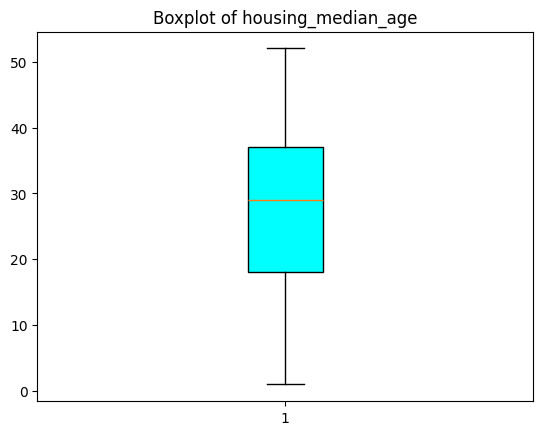

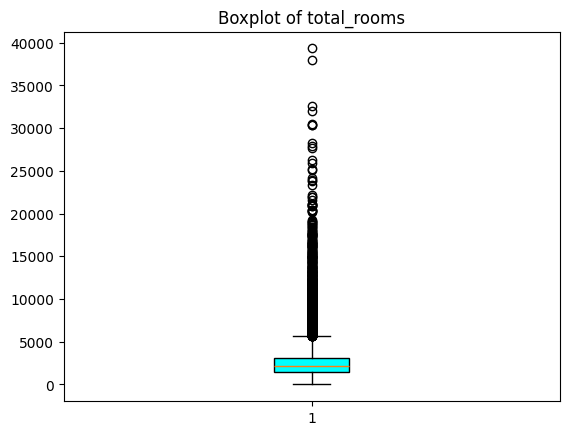

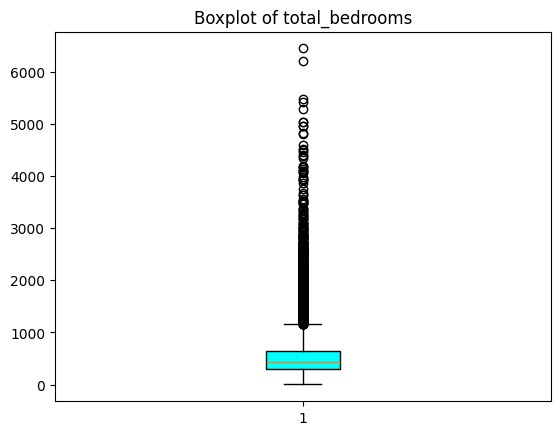

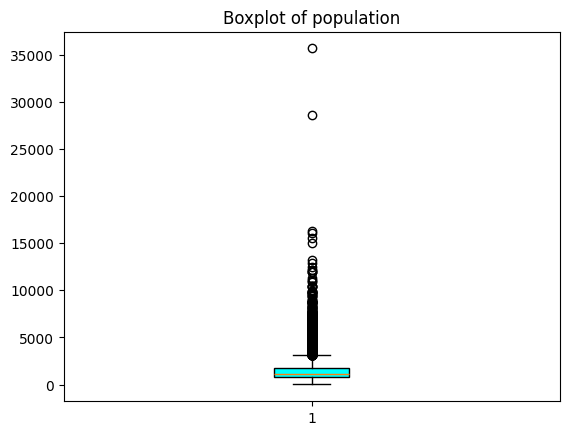

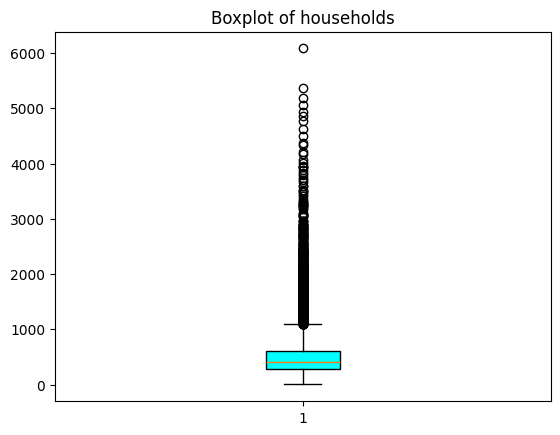

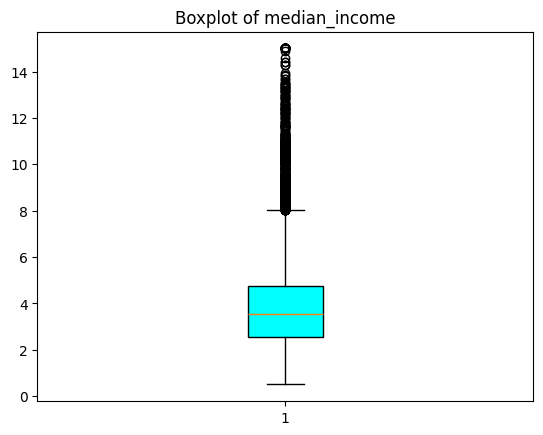

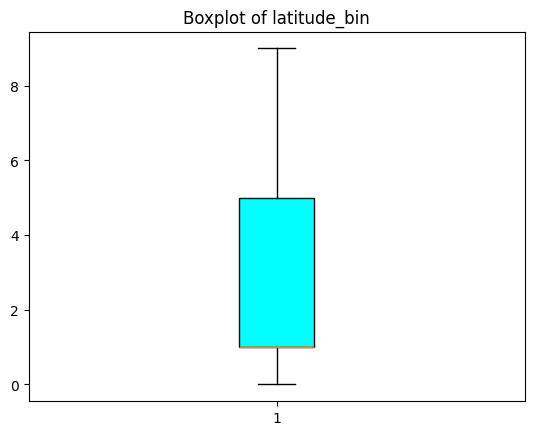

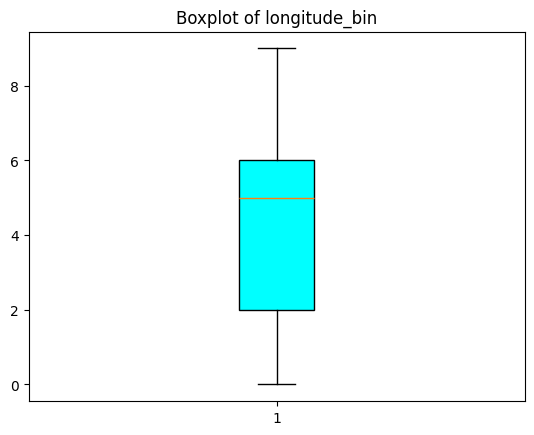

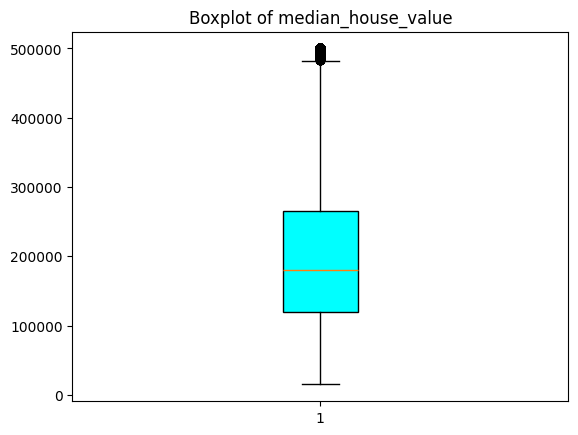

In [106]:
columns_to_check = ['housing_median_age', 'total_rooms', 'total_bedrooms', 
                          'population', 'households', 'median_income', 
                           'latitude_bin', 'longitude_bin',"median_house_value"]
for col in columns_to_check:
    box = plt.boxplot(df[col], patch_artist=True)
    colors = ['cyan']
    for patch, color in zip(box['boxes'], colors):
        patch.set_facecolor(color)

    plt.title(f'Boxplot of {col}')
    plt.show()


In [92]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from scipy.stats import normaltest

# Load your dataset into a DataFrame (replace 'your_data.csv' with your actual data file)
# df = pd.read_csv('your_data.csv')

# Define the columns you want to standardize
columns_to_standardize = ['housing_median_age', 'total_rooms', 'total_bedrooms', 
                          'population', 'households', 'median_income', 
                           'latitude_bin', 'longitude_bin']

# Create a DataFrame containing only the selected columns
data_to_standardize = df[columns_to_standardize]

# Initialize the StandardScaler
scaler = StandardScaler()

# Standardize the data and create a DataFrame with column names
data_standardized = pd.DataFrame(scaler.fit_transform(data_to_standardize), columns=columns_to_standardize)

data_standardized.describe()


,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,latitude_bin,longitude_bin
count,2.064000e+04,2.064000e+04,2.064000e+04,2.064000e+04,2.064000e+04,2.064000e+04,2.064000e+04,2.064000e+04
mean,5.508083e-18,3.201573e-17,-9.363741e-17,-1.101617e-17,6.885104e-17,6.609700e-17,6.609700e-17,1.542263e-16
std,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00
min,-2.196180e+00,-1.207283e+00,-1.277688e+00,-1.256123e+00,-1.303984e+00,-1.774299e+00,-1.232231e+00,-2.113326e+00
25%,-8.453931e-01,-5.445698e-01,-5.718868e-01,-5.638089e-01,-5.742294e-01,-6.881186e-01,-7.921716e-01,-1.136142e+00
50%,2.864572e-02,-2.332104e-01,-2.428309e-01,-2.291318e-01,-2.368162e-01,-1.767951e-01,-7.921716e-01,3.296339e-01
75%,6.643103e-01,2.348028e-01,2.537334e-01,2.644949e-01,2.758427e-01,4.593063e-01,9.680676e-01,8.182259e-01
max,1.856182e+00,1.681558e+01,1.408779e+01,3.025033e+01,1.460152e+01,5.858286e+00,2.728307e+00,2.284002e+00


In [93]:
pd.DataFrame(data_standardized)

,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,latitude_bin,longitude_bin
0,0.982143,-0.804819,-0.972476,-0.974429,-0.977033,2.344766,0.968068,-1.136142
1,-0.607019,2.045890,1.357143,0.861439,1.669961,2.332238,0.968068,-1.136142
2,1.856182,-0.535746,-0.827024,-0.820777,-0.843637,1.782699,0.968068,-1.136142
3,1.856182,-0.624215,-0.719723,-0.766028,-0.733781,0.932968,0.968068,-1.136142
4,1.856182,-0.462404,-0.612423,-0.759847,-0.629157,-0.012881,0.968068,-1.136142
...,...,...,...,...,...,...,...,...
20635,-0.289187,-0.444985,-0.388283,-0.512592,-0.443449,-1.216128,1.848187,-0.647550
20636,-0.845393,-0.888704,-0.922403,-0.944405,-1.008420,-0.691593,1.848187,-0.647550
20637,-0.924851,-0.174995,-0.123608,-0.369537,-0.174042,-1.142593,1.848187,-0.647550
20638,-0.845393,-0.355600,-0.304827,-0.604429,-0.393753,-1.054583,1.848187,-0.647550


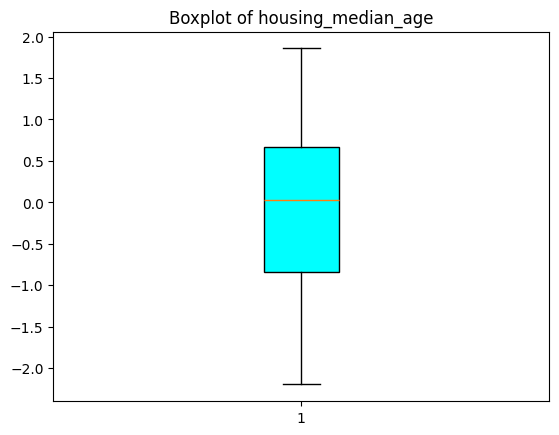

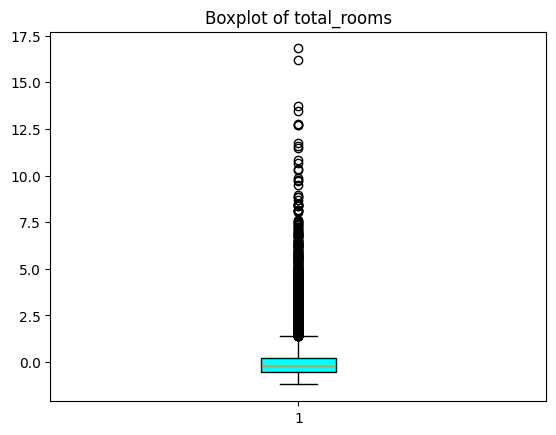

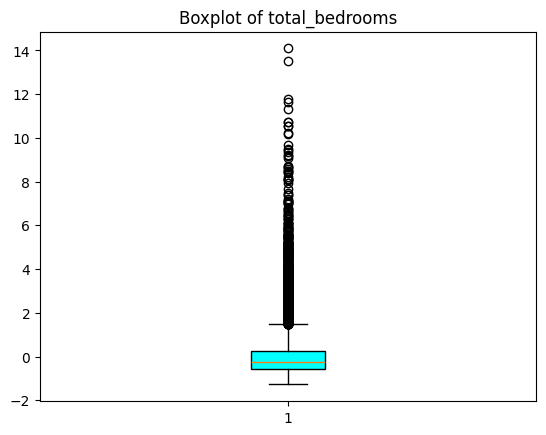

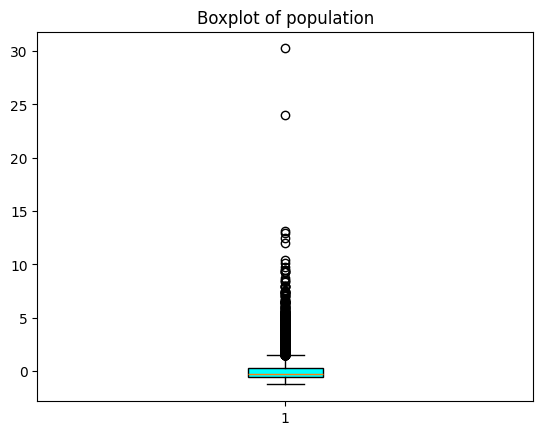

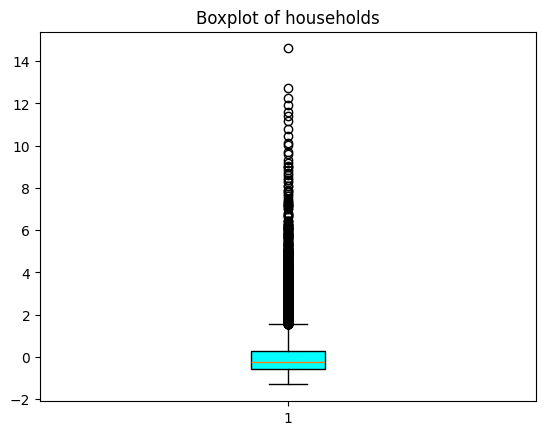

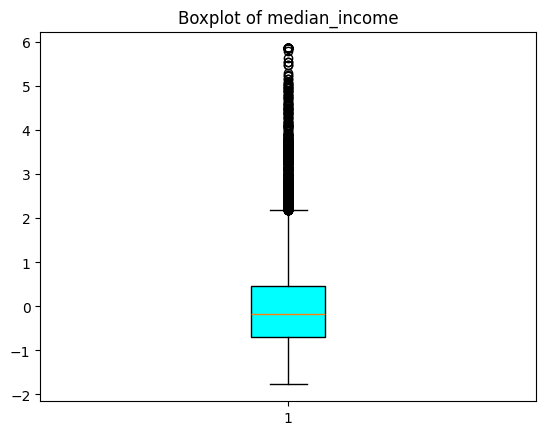

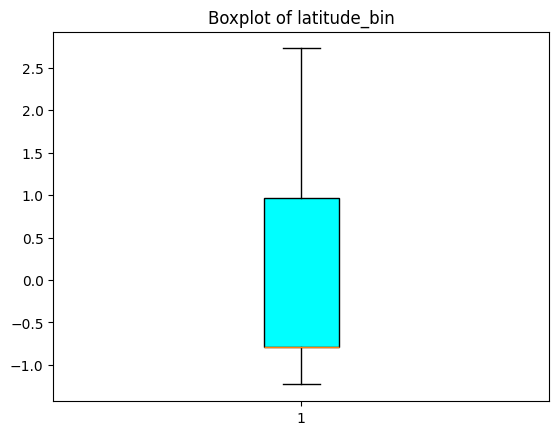

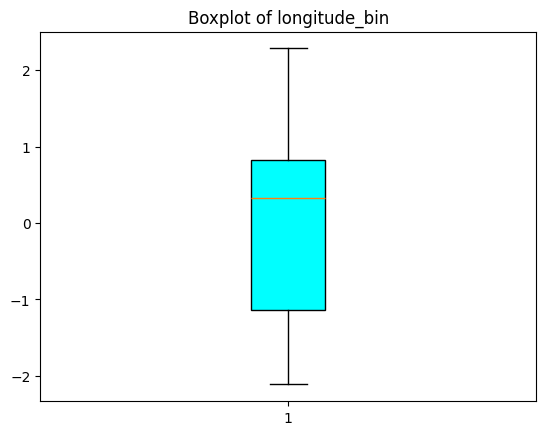

In [113]:
columns_to_check = ['housing_median_age', 'total_rooms', 'total_bedrooms', 
                          'population', 'households', 'median_income', 
                           'latitude_bin', 'longitude_bin']
for col in columns_to_check:
    box = plt.boxplot(data_standardized[col], patch_artist=True)
    colors = ['cyan']
    for patch, color in zip(box['boxes'], colors):
        patch.set_facecolor(color)

    plt.title(f'Boxplot of {col}')
    plt.show()



In [99]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# Define the target variable and the feature variables
y = df['median_house_value']#target
X = data_standardized.copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Linear Regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)#fit -> train the model -> learn

# Make predictions
predictions = model.predict(X_test)#making inference -> will predict

# Evaluate the model
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

mse, r2


(5054436877.052176, 0.6142855428358496)

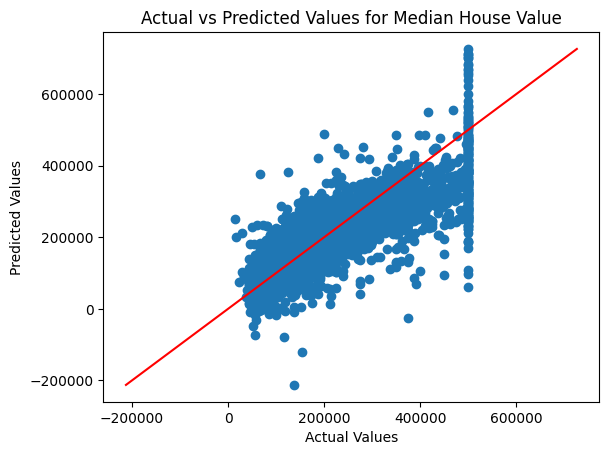

In [102]:
import matplotlib.pyplot as plt
import numpy as np

# Scatter plot of actual vs predicted values
plt.scatter(y_test, predictions)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values for Median House Value')

# Add a line of perfect prediction
min_val = min(min(y_test), min(predictions))
max_val = max(max(y_test), max(predictions))
plt.plot([min_val, max_val], [min_val, max_val], color='red')

plt.show()


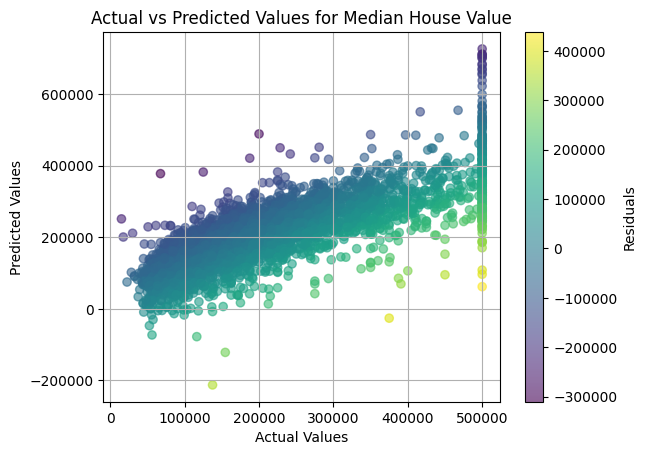

In [104]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate residuals
residuals = y_test - predictions

# Scatter plot of actual vs predicted values
plt.scatter(y_test, predictions, c=residuals, cmap='viridis', alpha=0.6)
plt.colorbar(label='Residuals') # add a colorbar
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values for Median House Value')
plt.grid(True)
plt.show()


In [109]:
from sklearn.preprocessing import PowerTransformer

# Instantiate the PowerTransformer with Box-Cox
pt = PowerTransformer(method='yeo-johnson', standardize=False) # Set standardize=False to perform only Box-Cox

# Define the columns you want to standardize
columns_to_transform = ['housing_median_age', 'total_rooms', 'total_bedrooms', 
                          'population', 'households', 'median_income', 
                           'latitude_bin', 'longitude_bin']

# Create a DataFrame containing only the selected columns
data_to_normalize = df[columns_to_transform]

# Fit the data to the power transform featurewise
transformed_data = pt.fit_transform(data_to_normalize)

# Standardize the data and create a DataFrame with column names
data_normalize = pd.DataFrame(transformed_data, columns=columns_to_transform)

data_normalize.describe()





,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,latitude_bin,longitude_bin
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,17.609930,20.051846,12.802662,18.119393,13.544394,1.300473,1.171778,4.736634
std,6.684307,3.832602,2.611999,3.639774,2.904823,0.264352,0.667996,2.312776
min,0.929239,1.242241,0.748331,1.636997,0.753796,0.389515,0.000000,0.000000
25%,12.126445,17.937712,11.306170,16.044928,11.905560,1.123114,0.702023,2.103814
50%,18.093044,19.916769,12.682222,17.997137,13.424642,1.306023,0.702023,5.470920
75%,22.162187,22.113286,14.218020,20.129291,15.146652,1.476979,1.851877,6.627307
max,29.380778,41.839185,26.497935,45.237305,29.344698,2.132255,2.402497,10.168425


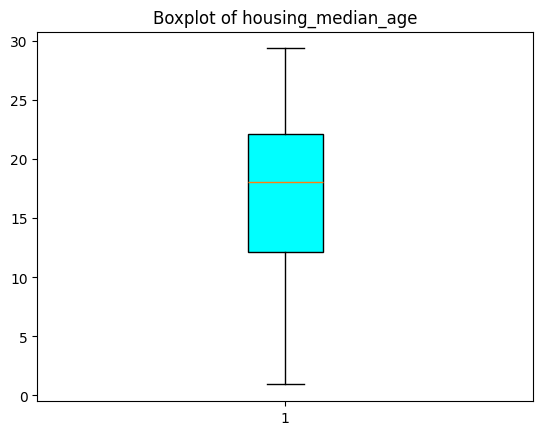

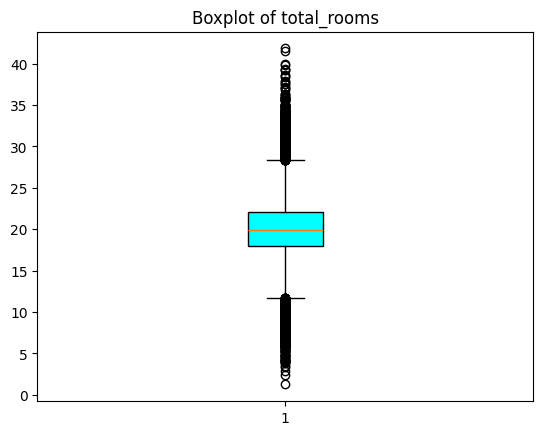

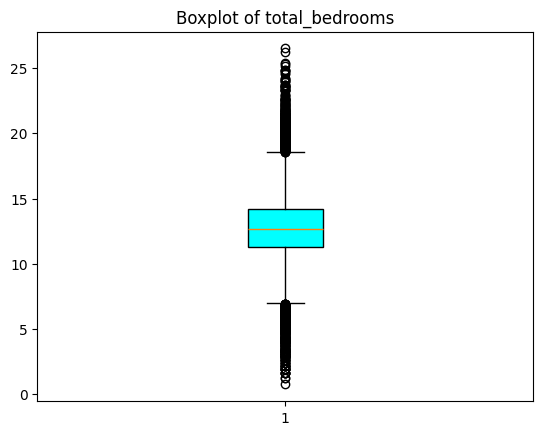

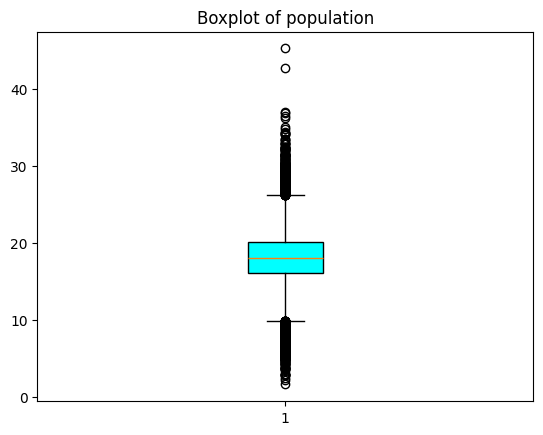

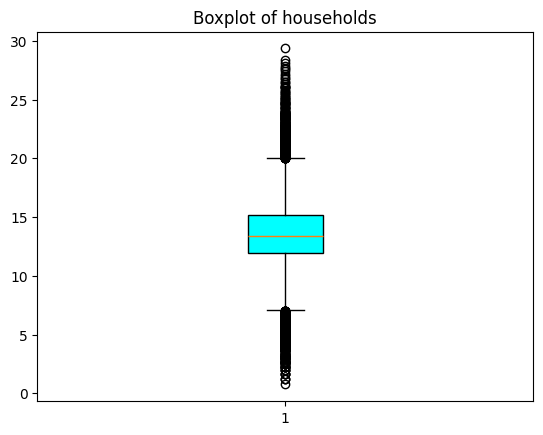

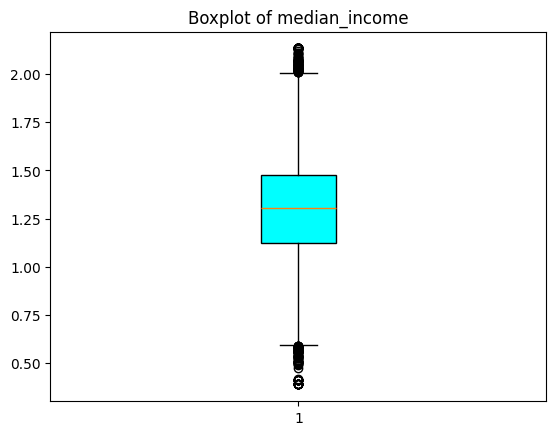

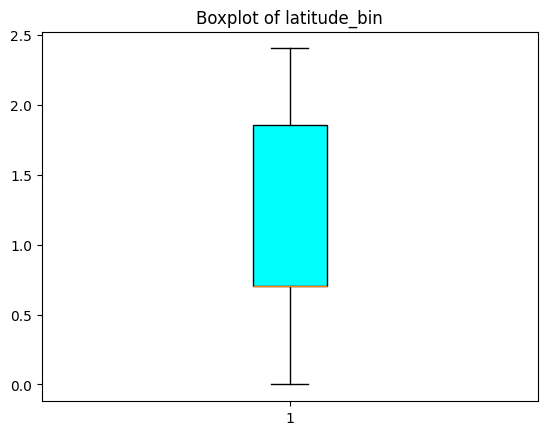

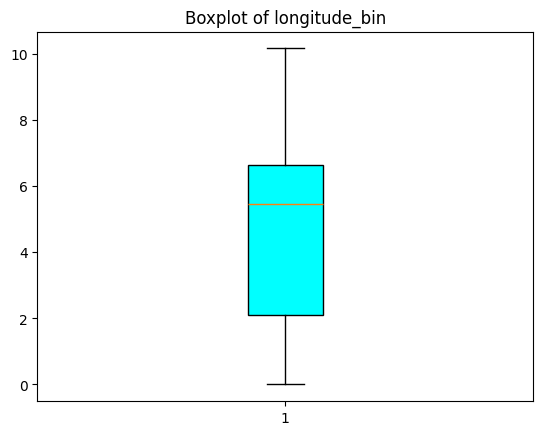

In [112]:
columns_to_check = ['housing_median_age', 'total_rooms', 'total_bedrooms', 
                          'population', 'households', 'median_income', 
                           'latitude_bin', 'longitude_bin']
for col in columns_to_check:
    box = plt.boxplot(data_normalize[col], patch_artist=True)
    colors = ['cyan']
    for patch, color in zip(box['boxes'], colors):
        patch.set_facecolor(color)

    plt.title(f'Boxplot of {col}')
    plt.show()



mean_squared_error 5786938231.346178
r2_score 0.5583868603285521


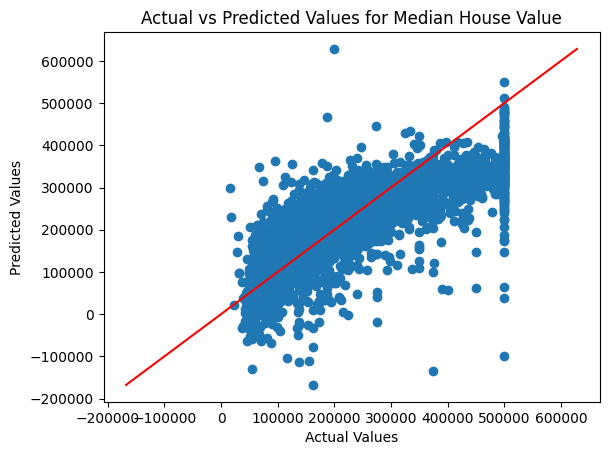

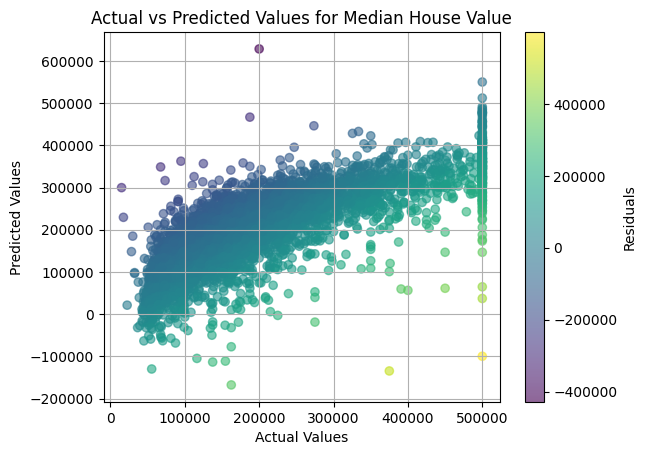

In [115]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# Define the target variable and the feature variables
y = df['median_house_value']
X = data_normalize.copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Linear Regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions
predictions = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print("mean_squared_error", mse)
print("r2_score", r2)


import matplotlib.pyplot as plt
import numpy as np

# Scatter plot of actual vs predicted values
plt.scatter(y_test, predictions)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values for Median House Value')

# Add a line of perfect prediction
min_val = min(min(y_test), min(predictions))
max_val = max(max(y_test), max(predictions))
plt.plot([min_val, max_val], [min_val, max_val], color='red')

plt.show()

import matplotlib.pyplot as plt
import numpy as np

# Calculate residuals
residuals = y_test - predictions

# Scatter plot of actual vs predicted values
plt.scatter(y_test, predictions, c=residuals, cmap='viridis', alpha=0.6)
plt.colorbar(label='Residuals') # add a colorbar
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values for Median House Value')
plt.grid(True)
plt.show()




In [117]:
from sklearn.preprocessing import RobustScaler


scaler = RobustScaler()

# Define the columns you want to standardize
columns_to_transform = ['housing_median_age', 'total_rooms', 'total_bedrooms', 
                          'population', 'households', 'median_income', 
                           'latitude_bin', 'longitude_bin']

# Create a DataFrame containing only the selected columns
data_to_robust_scale = df[columns_to_transform]

# Fit the data to the power transform featurewise
transformed_data = scaler.fit_transform(data_to_robust_scale)

# Standardize the data and create a DataFrame with column names
data_rscaled = pd.DataFrame(transformed_data, columns=columns_to_transform)

data_rscaled.describe()



,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,latitude_bin,longitude_bin
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,2.064000e+04,20640.000000,20640.000000
mean,-0.018974,0.299228,0.294119,0.276628,0.278584,1.540799e-01,0.450036,-0.168665
std,0.662398,1.283114,1.211240,1.207316,1.176399,8.715378e-01,0.568118,0.511687
min,-1.473684,-1.249816,-1.253430,-1.239872,-1.255385,-1.392252e+00,-0.250000,-1.250000
25%,-0.578947,-0.399500,-0.398556,-0.404051,-0.396923,-4.456270e-01,0.000000,-0.750000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,1.018608e-16,0.000000,0.000000
75%,0.421053,0.600500,0.601444,0.595949,0.603077,5.543730e-01,1.000000,0.250000
max,1.210526,21.875018,17.357401,36.797441,17.455385,5.259674e+00,2.000000,1.000000


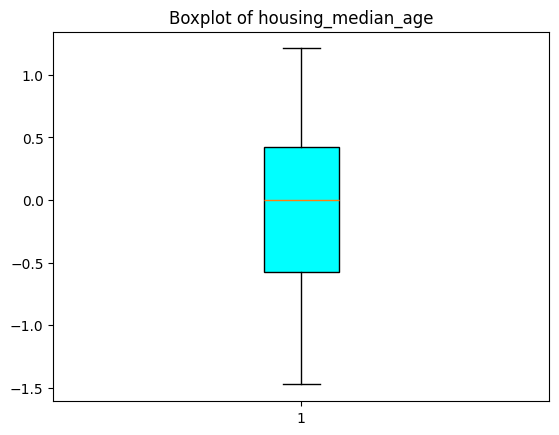

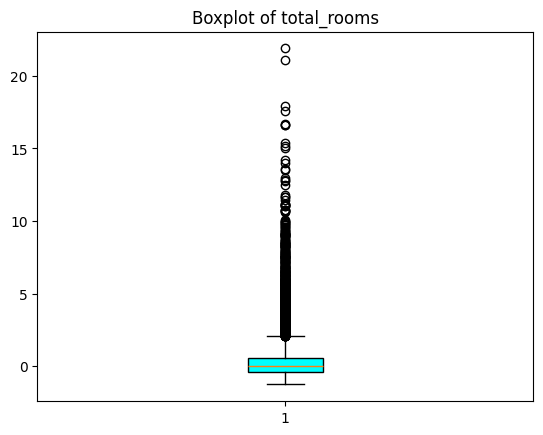

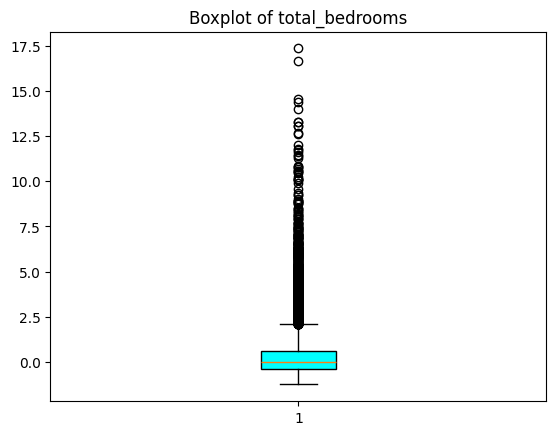

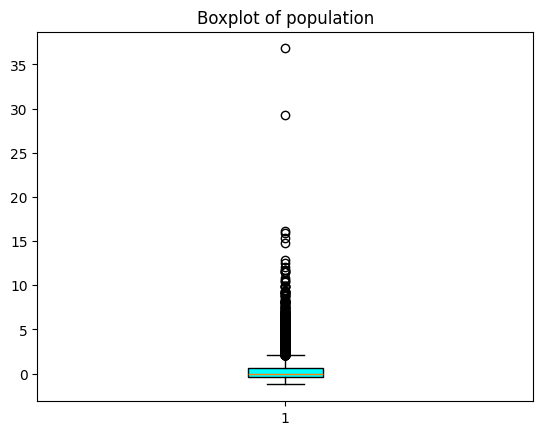

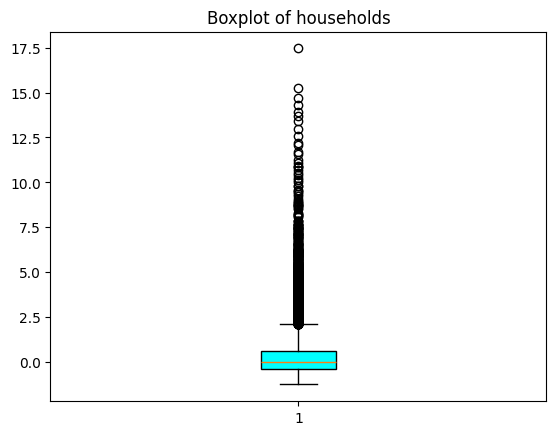

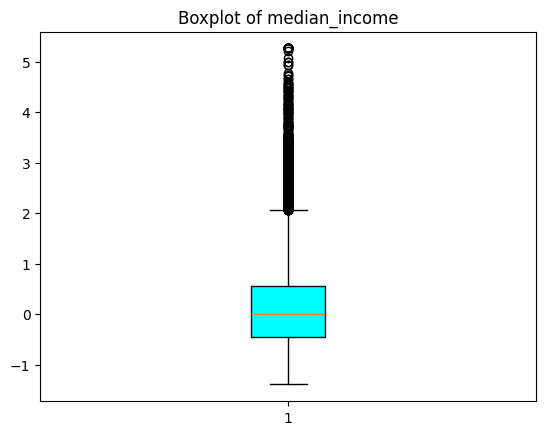

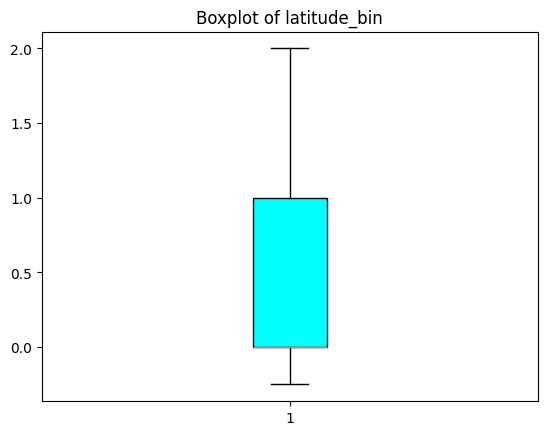

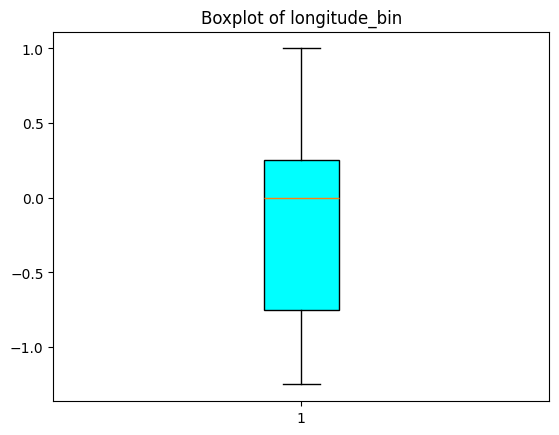

In [118]:
columns_to_check = ['housing_median_age', 'total_rooms', 'total_bedrooms', 
                          'population', 'households', 'median_income', 
                           'latitude_bin', 'longitude_bin']
for col in columns_to_check:
    box = plt.boxplot(data_rscaled[col], patch_artist=True)
    colors = ['cyan']
    for patch, color in zip(box['boxes'], colors):
        patch.set_facecolor(color)

    plt.title(f'Boxplot of {col}')
    plt.show()



Root mean squared error : 5054436877.052176 
 R-Squared : 0.6142855428358496


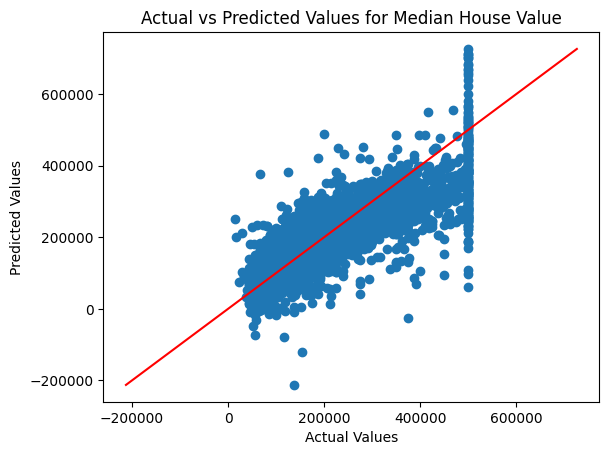

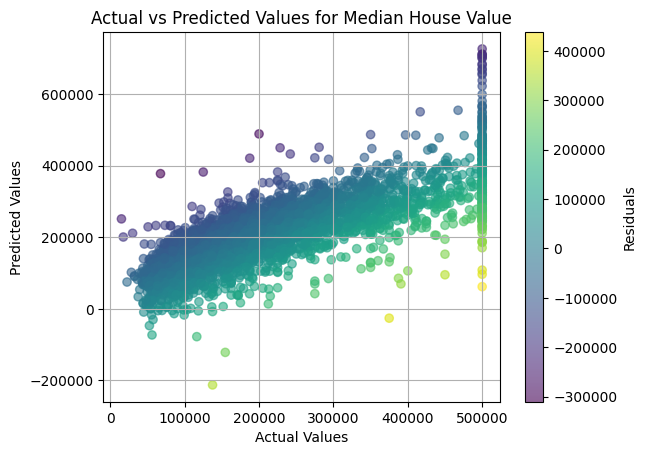

In [119]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# Define the target variable and the feature variables
y = df['median_house_value']
X = data_rscaled.copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Linear Regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions
predictions = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print("Root mean squared error :",mse,"\n","R-Squared :", r2)


import matplotlib.pyplot as plt
import numpy as np

# Scatter plot of actual vs predicted values
plt.scatter(y_test, predictions)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values for Median House Value')

# Add a line of perfect prediction
min_val = min(min(y_test), min(predictions))
max_val = max(max(y_test), max(predictions))
plt.plot([min_val, max_val], [min_val, max_val], color='red')

plt.show()

import matplotlib.pyplot as plt
import numpy as np

# Calculate residuals
residuals = y_test - predictions

# Scatter plot of actual vs predicted values
plt.scatter(y_test, predictions, c=residuals, cmap='viridis', alpha=0.6)
plt.colorbar(label='Residuals') # add a colorbar
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values for Median House Value')
plt.grid(True)
plt.show()




In [125]:
print(model.intercept_)
print(model.coef_)
print(model.score(X_train, y_train))
print(model.score(X_test, y_test))
print(model.rank_)

231666.56933656355
[  22599.77025901  -15577.48099775   37075.10404231  -34527.06092387
   17947.92476509   88946.79499638 -146318.83673633 -153408.16419445]
0.6403478468932098
0.6142855428358496
8


In [126]:
# Coefficients and intercept from the model
intercept = 231666.56933656355
coefficients = [22599.77025901, -15577.48099775, 37075.10404231, -34527.06092387, 
                17947.92476509, 88946.79499638, -146318.83673633, -153408.16419445]

# Sample feature values
sample_features = [1, 0, 2, 0, 1, 0, 1, 0]

# Calculate the predicted result using the linear equation
predicted_result = intercept + sum(coef * feature for coef, feature in zip(coefficients, sample_features))
predicted_result


200045.63570895354

In [129]:
import pandas as pd
import numpy as np
from scipy.stats import ttest_ind
from sklearn.feature_selection import VarianceThreshold

def process_data(data):
    # Calculate the correlation matrix
    corr_matrix = data.corr().abs()

    # Select upper triangle of correlation matrix
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool_))

    # Find index of feature columns with correlation greater than 0.95
    to_drop = [column for column in upper.columns if any(upper[column] > 0.90)]

    # Drop highly correlated features
    data = data.drop(columns=to_drop)

    # Calculate variance
    variances = data.var()

    # Perform t-test
    t_tests = {}
    for i in range(len(data.columns)):
        for j in range(i+1, len(data.columns)):
            t_test_result = ttest_ind(data.iloc[:, i], data.iloc[:, j], equal_var=False)  # added equal_var parameter
            t_tests[f"{data.columns[i]} vs {data.columns[j]}"] = t_test_result

    return data, variances, t_tests

# Assuming 'df' is a pandas DataFrame and 'columns_to_check' is a list of column names
data, variances, t_tests = process_data(df[columns_to_check])

print("Updated Data:")
print(data)
print("\nVariances:")
print(variances)
print("\nT-Tests:")
for key, value in t_tests.items():
    print(f"{key}: p-value={value.pvalue}")


Updated Data:
       housing_median_age  total_rooms  population  median_income  \
0                    41.0        880.0       322.0         8.3252   
1                    21.0       7099.0      2401.0         8.3014   
2                    52.0       1467.0       496.0         7.2574   
3                    52.0       1274.0       558.0         5.6431   
4                    52.0       1627.0       565.0         3.8462   
...                   ...          ...         ...            ...   
20635                25.0       1665.0       845.0         1.5603   
20636                18.0        697.0       356.0         2.5568   
20637                17.0       2254.0      1007.0         1.7000   
20638                18.0       1860.0       741.0         1.8672   
20639                16.0       2785.0      1387.0         2.3886   

       latitude_bin  
0                 5  
1                 5  
2                 5  
3                 5  
4                 5  
...             ...  
206

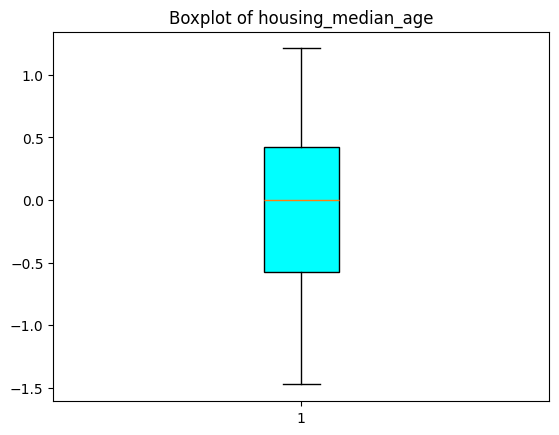

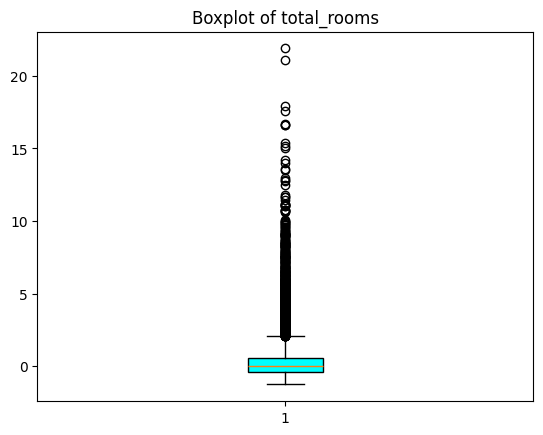

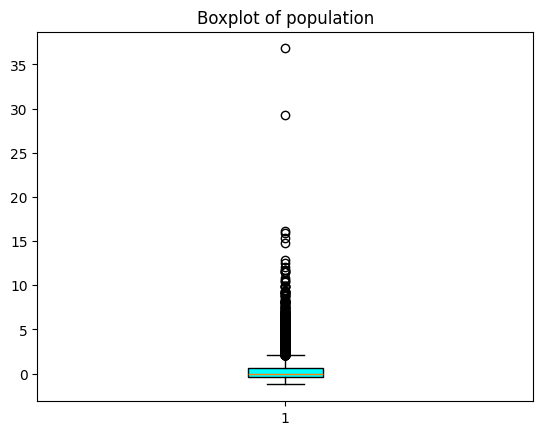

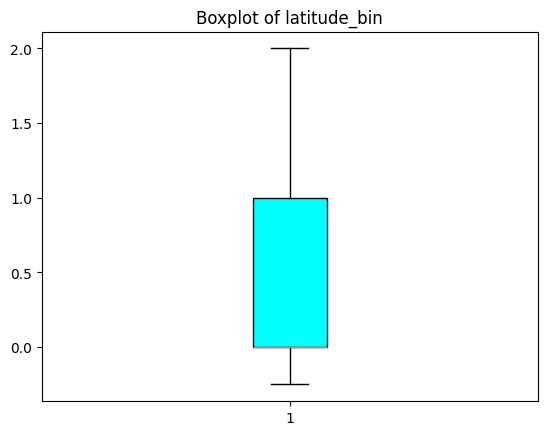

In [130]:
from sklearn.preprocessing import RobustScaler


scaler = RobustScaler()

# Define the columns you want to standardize
columns_to_transform = ['housing_median_age', 'total_rooms', 
                          'population', 
                           'latitude_bin']

# Create a DataFrame containing only the selected columns
data_to_robust_scale = df[columns_to_transform]

# Fit the data to the power transform featurewise
transformed_data = scaler.fit_transform(data_to_robust_scale)

# Standardize the data and create a DataFrame with column names
data_rscaled = pd.DataFrame(transformed_data, columns=columns_to_transform)

data_rscaled.describe()

columns_to_check = columns_to_transform

for col in columns_to_check:
    box = plt.boxplot(data_rscaled[col], patch_artist=True)
    colors = ['cyan']
    for patch, color in zip(box['boxes'], colors):
        patch.set_facecolor(color)

    plt.title(f'Boxplot of {col}')
    plt.show()

In [133]:
# from sklearn.linear_model import LinearRegression
# from sklearn.metrics import mean_squared_error, r2_score
# from sklearn.model_selection import train_test_split

# # Define the target variable and the feature variables
# y = df['median_house_value']
# X = data_rscaled.copy()

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Create a Linear Regression model
# model = LinearRegression()

# # Train the model
# model.fit(X_train, y_train)

# # Make predictions
# predictions = model.predict(X_test)

# # Evaluate the model
# mse = mean_squared_error(y_test, predictions)
# r2 = r2_score(y_test, predictions)

# print("mean_squared_error >", mse)
# print("r2_score >", r2)


# import matplotlib.pyplot as plt
# import numpy as np

# # Scatter plot of actual vs predicted values
# plt.scatter(y_test, predictions)
# plt.xlabel('Actual Values')
# plt.ylabel('Predicted Values')
# plt.title('Actual vs Predicted Values for Median House Value')

# # Add a line of perfect prediction
# min_val = min(min(y_test), min(predictions))
# max_val = max(max(y_test), max(predictions))
# plt.plot([min_val, max_val], [min_val, max_val], color='red')

# plt.show()

# import matplotlib.pyplot as plt
# import numpy as np

# # Calculate residuals
# residuals = y_test - predictions

# # Scatter plot of actual vs predicted values
# plt.scatter(y_test, predictions, c=residuals, cmap='viridis', alpha=0.6)
# plt.colorbar(label='Residuals') # add a colorbar
# plt.xlabel('Actual Values')
# plt.ylabel('Predicted Values')
# plt.title('Actual vs Predicted Values for Median House Value')
# plt.grid(True)
# plt.show()


